# Compare observer and theory runaways

In [1]:
import cogsworth
import astropy.units as u
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
import gala.dynamics as gd
import gala.potential as gp
from gala.units import galactic
from scipy.integrate import cumulative_trapezoid
from astropy.coordinates import SkyCoord

/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:193: GalaFutureWarning: In a future version of Gala, the current MilkyWayPotential and MilkyWayPotential2022 classes will be combined into a single class, MilkyWayPotential, with an optional 'version' argument to select between the models. To use the old (version 1) MilkyWayPotential, specify version="v1" when creating an instance. To use the newer (version 2 = current MilkyWayPotential2022), specify version="v2".
  warnings.warn(
/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(


In [2]:
%config InlineBackend.figure_format = 'retina'
plt.style.use("default")


pd.options.display.max_columns = 999

plt.rc('font', family='serif')
plt.rcParams['text.usetex'] = False
fs = 24

# update various fontsizes to match
params = {'figure.figsize': (12, 8),
          'legend.fontsize': fs,
          'axes.labelsize': fs,
          'xtick.labelsize': 0.9 * fs,
          'ytick.labelsize': 0.9 * fs,
          'axes.linewidth': 1.1,
          'xtick.major.size': 7,
          'xtick.minor.size': 4,
          'ytick.major.size': 7,
          'ytick.minor.size': 4}
plt.rcParams.update(params)

# The plan

Currently observations of runaways are not measuring quite the same things as theory predicts and this may cause confusion when trying to constrain models making predictions of runaways.

Observations of runaways define them as stars which have a velocity
$$v = || v_{2, \rm today} - v_{\rm Gal}(x_{\rm today}) || > 30 \, {\rm km / s}$$
whereas theoretical predictions instead require
$$v = || v_{2, \rm SN1} - v_{\rm CM, SN1} || > 30 \, {\rm km / s}$$


The key difference here being that the star will have moved far from the original supernova location and so you could be comparing two very different populations. We're going to check how different these values actually are on a population level and so the two things we want to answer are:

1. How much does the velocity change (i.e. $v_{\rm 2, TAMS}$ vs. $v_{\rm 2, SN1}$) for runaway stars
2. How different are the observational and theory velocities

# Prep data

## First the simulation

In [ ]:
import h5py as h5
with h5.File("/mnt/home/twagg/ceph/runaway-defs/disp_2_r_3_kick_5.h5", "r") as f:
    print(f["initial_galaxy"].attrs["params"])
    f["initial_galaxy"].attrs["params"] = f["initial_galaxy"].attrs["params"].replace("!!python/name:sfh_model.RecentSB15Annulus ''", "''")

{_size: 3282312, class_name: StarFormationHistory, cluster_radius: 3.0, cluster_radius_unit: pc,
  n_per_cluster: 100, near_thresh: 3.0, near_thresh_unit: kpc, sfh_model: !!python/name:sfh_model.RecentSB15Annulus '',
  velocity_dispersion: 2.0, velocity_dispersion_unit: km / s}



KeyError: 'Unable to delete attribute (no write intent on file)'

In [3]:
%%time
p = cogsworth.pop.load("/mnt/home/twagg/ceph/runaway-defs/disp_2_r_3_kick_5.h5")
p.bpp["row_ind"] = np.arange(len(p.bpp))

/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(


CPU times: user 4.69 s, sys: 4.41 s, total: 9.11 s
Wall time: 22.5 s


ConstructorError: while constructing a Python object
cannot find module 'sfh_model' (No module named 'sfh_model')
  in "<unicode string>", line 2, column 75:
     ... ar_thresh_unit: kpc, sfh_model: !!python/name:sfh_model.RecentSB ... 
                                         ^

In [21]:
%%time
p.final_pos

CPU times: user 148 ms, sys: 166 ms, total: 315 ms
Wall time: 316 ms


<Quantity [[ 1.12610243e+01,  2.81509844e+01,  4.40097211e+01],
           [ 6.95752718e+00,  2.71067576e+00,  3.48188567e-01],
           [ 8.30857210e+00, -1.00672605e+00, -7.45819988e-02],
           ...,
           [-1.49708416e+00,  3.50846584e+00, -1.76238010e-01],
           [-2.59587178e+00,  6.80828589e+00,  2.81262050e+01],
           [-1.53341378e+00,  3.94578938e+00, -1.66095042e-02]] kpc>

In [22]:
# check we have the right mass
(p.mass_singles + p.mass_binaries) / (2 * u.Msun * 200 * u.Myr / u.yr).to(u.Msun).value

np.float64(1.6244396131547092)

In [23]:
(2 * u.Msun * 200 * u.Myr / u.yr).to(u.Msun)

<Quantity 4.e+08 solMass>

In [33]:
p._orbits = np.array([None for _ in range(len(p) + p.disrupted.sum())])

# Inspect initial galaxy

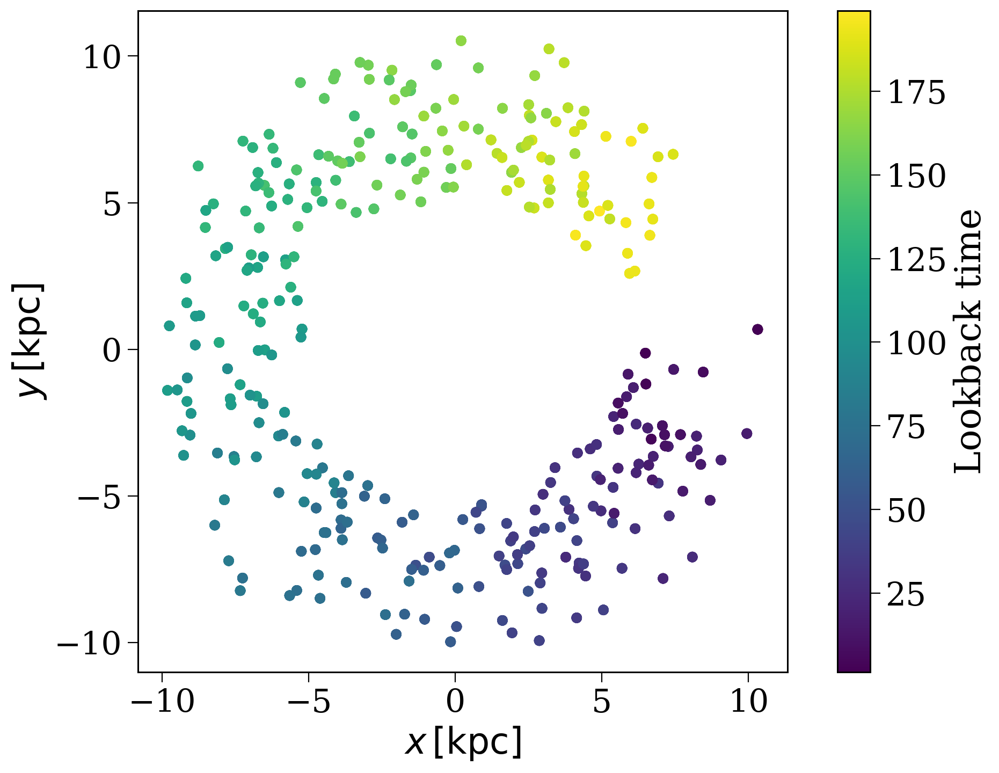

In [25]:
fig, ax = plt.subplots()

every = 1000

scatter = ax.scatter(p.initial_galaxy.x[::every], p.initial_galaxy.y[::every],
                     c=p.initial_galaxy.tau.to(u.Myr).value[::every], rasterized=True)
fig.colorbar(scatter, label="Lookback time")

ax.set_aspect("equal")
ax.set(xlabel=r"$x \, [\rm kpc]$", ylabel=r"$y \, [\rm kpc]$")

plt.show()

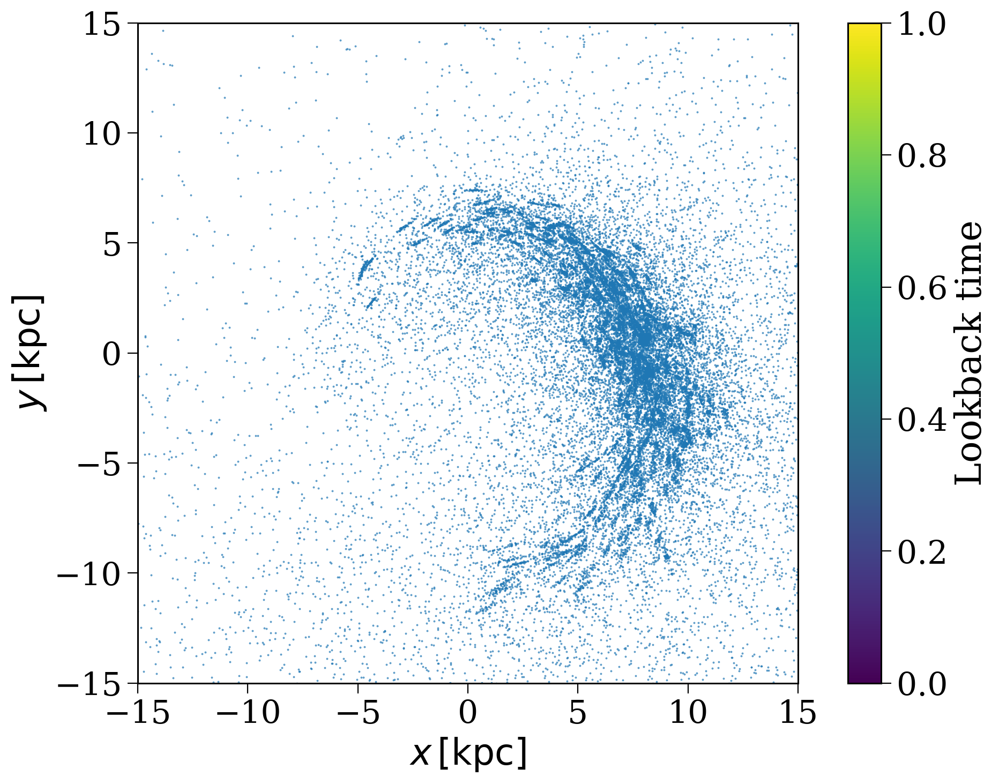

In [26]:
fig, ax = plt.subplots()

every = 100

scatter = ax.scatter(p.final_pos[::every, 0], p.final_pos[::every, 1], rasterized=True, s=.1)
fig.colorbar(scatter, label="Lookback time")

ax.set_aspect("equal")
ax.set(xlabel=r"$x \, [\rm kpc]$", ylabel=r"$y \, [\rm kpc]$", xlim=(-15, 15), ylim=(-15, 15))

plt.show()

# Select out the right binaries
## Theorists

For theorists we consider the system immediately after the first supernova. Either of the following two cases need to be met:
- System is bound after SN (`sep > 0`), companion has `teff > 30kK`, `vsys_1_total > 30 km/s`
- Or system is disrupted after SN (`sep < 0`), ejected companion has `teff > 30kK`, `vsys_2_total > 30 km/s`
In both cases we then need to run more detailed evolution to get the temperature evolution of the companion.

In [34]:
def get_theorist_population(p, teff_thresh=30000, vel_thresh=30, near_thresh=3 * u.kpc):
    # get the first kick associated with each binary (ignoring any that didn't have a kick)
    first_kicks = p.kick_info[p.kick_info["star"] != 0].drop_duplicates(subset="bin_num", keep="first")
    
    # get the bpp rows after the first kick
    first_kick_bpp = p.bpp[p.bpp["evol_type"].isin([15, 16])].drop_duplicates(subset="bin_num", keep="first")
    after_sn_1 = p.bpp.iloc[first_kick_bpp["row_ind"] + 1]
    
    # track the sun's location
    sun_loc = np.array([8.122, 0, 0]) * u.kpc
    
    # build some masks for the primary and secondary
    theorist_masks = {
        "co": {i: after_sn_1[f"kstar_{i}"].isin([13, 14]) for i in [1, 2]},             # is a compact object
        "ms": {i: after_sn_1[f"kstar_{i}"] <= 1 for i in [1, 2]},                       # is a MS star
        "hot": {i: after_sn_1[f"teff_{i}"] >= teff_thresh for i in [1, 2]},             # is above T thresh
        "fast": {i: first_kicks[f"vsys_{i}_total"] >= vel_thresh for i in [1, 2]},      # is fast enough
        "bound": after_sn_1["sep"] > 0.0,                                               # remained bound
        "disrupted": after_sn_1["sep"] < 0.0,                                           # got disrupted
        "nearby": {}
    }
    
    # mask for whether a binary had an SN
    had_sn = np.isin(p.bin_nums, first_kick_bpp["bin_num"])

    # construct a distance mask for every position
    dist_mask = np.linalg.norm(p.final_pos - sun_loc, axis=1) < near_thresh


    primary_nearby = dist_mask[:len(p)]
    secondary_nearby = dist_mask[:len(p)]
    secondary_nearby[p.disrupted] = dist_mask[len(p):]

    theorist_masks["nearby"][1] = primary_nearby[had_sn]
    theorist_masks["nearby"][2] = secondary_nearby[had_sn]

    # several cases could look like runaways
    # a) remained bound, one star is CO, other is MS, hot, fast, and nearby
    bound_runaways = (
        theorist_masks["bound"]
        & theorist_masks["fast"][1]
        & theorist_masks["nearby"][1]
        & (
            (theorist_masks["co"][1] & theorist_masks["ms"][2] & theorist_masks["hot"][2])
            | (theorist_masks["co"][2] & theorist_masks["ms"][1] & theorist_masks["hot"][1])
          )
    )

    # a) or, far more likely, got disrupted, and one star is MS, hot, fast, and nearby
    disrupted_runaways = (
        theorist_masks["disrupted"]
        & ((theorist_masks["fast"][1] & theorist_masks["ms"][1]
            & theorist_masks["hot"][1] & theorist_masks["nearby"][1])
           | (theorist_masks["fast"][2] & theorist_masks["ms"][2]
              & theorist_masks["hot"][2] & theorist_masks["nearby"][2]))
    )

    print(f"Found {np.sum(bound_runaways)} bound runaway candidates and {np.sum(disrupted_runaways)} disrupted runaway candidates")

    theorist_runaway_pop = p[first_kicks["bin_num"].values[bound_runaways | disrupted_runaways].astype(int)]
    
    return theorist_runaway_pop, theorist_masks

In [35]:
theorist_runaway_pop, theorist_masks = get_theorist_population(p, teff_thresh=0, near_thresh=3 * u.kpc)

Found 11284 bound runaway candidates and 19836 disrupted runaway candidates


In [46]:
first_kick_bpp = p.bpp[p.bpp["evol_type"].isin([15, 16])].drop_duplicates(subset="bin_num", keep="first")
unmerged_sn = first_kick_bpp["sep"] > 0

after_sn_1 = p.bpp.iloc[first_kick_bpp[unmerged_sn]["row_ind"] + 1]

In [40]:
first_kick_bpp

,tphys,mass_1,mass_2,kstar_1,kstar_2,sep,porb,ecc,RRLO_1,RRLO_2,evol_type,aj_1,aj_2,tms_1,tms_2,massc_1,massc_2,rad_1,rad_2,mass0_1,mass0_2,lum_1,lum_2,teff_1,teff_2,radc_1,radc_2,menv_1,menv_2,renv_1,renv_2,omega_spin_1,omega_spin_2,B_1,B_2,bacc_1,bacc_2,tacc_1,tacc_2,epoch_1,epoch_2,bhspin_1,bhspin_2,bin_num,row_ind
0,32.635425,9.368930,0.000000,5,15,0.000000,0.000000,-1.000000,0.000100,-1.000000,15,26.394650,0.000000,23.528280,1244.632401,2.928438,0.000000,8.823386e+02,1.000000e-10,10.091641,1.972557,6.872746e+04,1.000000e-10,3.160345e+03,1.833452e+06,1.092496e+01,1.000000e-10,4.975670e+00,1.000000e-10,8.169723e+02,1.000000e-10,3.997745e+15,2.385554e+01,0.0,0.0,0.0,0.0,0.0,0.0,6.240772,0.000655,0.0,0.0,0,8
1,4.231407,11.263105,15.414245,8,7,157.640562,44.412250,0.000000,0.019143,0.020857,15,0.602855,0.158471,0.583355,0.492020,8.651469,0.000000,1.105963e+00,1.275862e+00,11.654398,15.414245,3.611885e+05,3.568500e+05,1.351552e+05,1.254554e+05,6.999996e-05,0.000000e+00,1.000000e-10,1.542042e+01,1.000000e-10,1.275862e+00,3.201051e+07,8.171676e-02,0.0,0.0,0.0,0.0,0.0,0.0,3.628297,4.072644,0.0,0.0,1,24
2,3.934317,17.254278,0.000000,8,15,0.000000,0.000000,-1.000000,0.000100,-1.000000,15,0.461810,3.690888,0.459640,4.353874,13.066778,0.000000,1.320088e+00,2.686696e+01,17.364968,44.973166,5.760199e+05,5.557498e+05,1.390201e+05,3.054078e+04,6.999996e-05,0.000000e+00,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,5.632119e-03,1.358757e+01,0.0,0.0,0.0,0.0,0.0,0.0,3.472370,-0.157765,0.0,0.0,2,39
3,61.217966,0.000000,8.600943,15,5,0.000000,0.000000,-1.000000,-1.000000,0.000100,16,30.305789,31.921552,37.766821,28.407086,0.000000,2.565207,6.319518e+00,6.951709e+02,7.898718,9.122447,5.020479e+03,4.600988e+04,1.941395e+04,3.220599e+03,0.000000e+00,1.282734e+01,1.000000e-10,4.980166e+00,1.000000e-10,6.502859e+02,1.471273e+03,2.821256e+12,0.0,0.0,0.0,0.0,0.0,0.0,-0.262538,29.295563,0.0,0.0,3,49
6,16.602255,6.806356,0.000000,5,15,0.000000,0.000000,-1.000000,0.000100,-1.000000,15,9.956385,15.293312,8.940125,41.066798,6.780426,0.000000,1.299480e+01,4.169724e+00,19.129207,7.584600,1.861899e+05,2.813426e+03,3.340979e+04,2.067878e+04,1.197041e+00,0.000000e+00,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,9.812252e-01,8.054377e+02,0.0,0.0,0.0,0.0,0.0,0.0,6.645387,0.297992,0.0,0.0,6,88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3308877,6.487211,0.000000,9.736770,15,8,0.000000,0.000000,-1.000000,-1.000000,0.000100,16,3.340033,0.660075,3.837471,0.634198,0.000000,7.577419,3.927035e+01,1.067750e+00,54.606119,10.262032,8.381462e+05,3.096548e+05,2.799414e+04,1.323592e+05,0.000000e+00,6.999996e-05,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,2.098381e+02,1.382198e-01,0.0,0.0,0.0,0.0,0.0,0.0,-0.162837,5.826930,0.0,0.0,3308877,36505548
3308878,56.916884,0.000000,5.666505,15,5,0.000000,0.000000,-1.000000,-1.000000,0.000100,16,0.000000,18.132709,42.686307,16.150166,0.000000,3.716441,1.000000e-10,2.024669e+03,0.754926,12.144538,1.000000e-10,1.220718e+05,1.833452e+06,2.408499e+03,1.000000e-10,4.998632e+00,1.000000e-10,5.591239e-01,1.000000e-10,1.472086e+03,1.436001e+01,2.787007e+12,0.0,0.0,0.0,0.0,0.0,0.0,47.745775,38.783988,0.0,0.0,3308878,36505565
3308880,4.181769,9.208725,12.911343,8,7,61268.145502,373706.825588,0.116099,0.000051,0.000059,15,0.686379,0.365512,0.658943,0.547062,7.150362,0.000000,1.057461e+00,1.194652e+00,9.704411,12.911343,2.896968e+05,2.942815e+05,1.308047e+05,1.235491e+05,6.999996e-05,0.000000e+00,1.000000e-10,1.291257e+01,1.000000e-10,1.194652e+00,1.314558e+10,1.375322e-07,0.0,0.0,0.0,0.0,0.0,0.0,3.495341,3.816187,0.0,0.0,3308880,36505593
3308883,26.985612,5.025036,0.000000,5,15,0.000000,0.000000,-1.000000,0.000100,-1.000000,15,12.704612,23.805519,11.336622,34.261874,5.021047,0.000000,1.928462e+00,5.995748e+00,15.215202,8.167734,1.235610e+05,5.076789e+03,7.827705e+04,1.998689e+04,1.877225

In [41]:
p.bpp.loc[3308880]

,tphys,mass_1,mass_2,kstar_1,kstar_2,sep,porb,ecc,RRLO_1,RRLO_2,evol_type,aj_1,aj_2,tms_1,tms_2,massc_1,massc_2,rad_1,rad_2,mass0_1,mass0_2,lum_1,lum_2,teff_1,teff_2,radc_1,radc_2,menv_1,menv_2,renv_1,renv_2,omega_spin_1,omega_spin_2,B_1,B_2,bacc_1,bacc_2,tacc_1,tacc_2,epoch_1,epoch_2,bhspin_1,bhspin_2,bin_num,row_ind
3308880,0.000000,77.315497,61.901532,1,1,12182.009056,13207.005408,0.135087,0.003814,0.003618,1,0.000000,0.000000,3.449888e+00,3.671750e+00,0.000000,0.000000,16.007092,13.715530,77.315497,61.901532,8.377267e+05,5.606468e+05,43841.861054,42838.637452,0.000000,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,6.244111e+02,7.344951e+02,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,3308880,36505585
3308880,3.633288,45.486864,46.319495,2,1,18476.964016,30379.575178,0.135087,0.007944,0.007829,2,4.150641,3.895904,4.150641e+00,4.115035e+00,16.654098,0.000000,47.907341,47.603430,45.486864,46.319495,7.201398e+05,6.548991e+05,24401.851950,23905.293677,1.280230,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,1.631987e+00,6.150526e+00,0.0,0.0,0.0,0.0,0.0,0.0,-0.517353,-0.262616,0.0,0.0,3308880,36505586
3308880,3.638109,44.902567,46.198662,4,1,18612.352367,30832.727287,0.135059,0.397045,0.007783,2,4.155462,3.905518,4.150641e+00,4.120094e+00,16.987154,0.000000,2406.279361,47.786658,45.486864,46.198662,6.502163e+05,6.522893e+05,3356.302128,23835.613948,1.295776,0.000000,1.876127e+01,1.000000e-10,2.177543e+03,1.000000e-10,4.467794e-04,5.970930e+00,0.0,0.0,0.0,0.0,0.0,0.0,-0.517353,-0.267409,0.0,0.0,3308880,36505587
3308880,3.812594,18.729798,45.739514,7,1,21921.745609,46849.864803,0.118152,0.000244,0.007167,2,0.164574,4.098059,4.405523e-01,4.139651e+00,0.000000,0.000000,1.436398,63.430784,18.729798,45.739514,5.073421e+05,6.661035e+05,129109.263472,20797.206546,0.000000,0.000000,1.872980e+01,1.000000e-10,1.436398e+00,1.000000e-10,3.450293e-11,1.646077e+01,0.0,0.0,0.0,0.0,0.0,0.0,3.648020,-0.285465,0.0,0.0,3308880,36505588
3308880,3.854423,16.655925,44.633523,7,2,23059.982536,51840.330871,0.118152,0.000224,0.004923,2,0.219020,4.189017,4.706505e-01,4.189017e+00,0.000000,16.233530,1.356811,46.652920,16.655925,44.633523,4.309103e+05,6.945639e+05,127528.315185,24505.200197,0.000000,1.260419,1.665593e+01,1.000000e-10,1.356811e+00,1.000000e-10,2.517737e-04,3.937006e+01,0.0,0.0,0.0,0.0,0.0,0.0,3.635403,-0.334594,0.0,0.0,3308880,36505589
3308880,3.859324,16.445236,44.047932,7,4,23360.586709,53204.040642,0.118146,0.000220,0.247061,2,0.225539,4.193919,4.740870e-01,4.189017e+00,0.000000,16.558178,1.348529,2371.778801,16.445236,44.633523,4.232080e+05,6.275604e+05,127343.839288,3350.783749,0.000000,1.275730,1.644524e+01,1.857494e+01,1.348529e+00,2.149214e+03,2.267767e+01,9.806443e-03,0.0,0.0,0.0,0.0,0.0,0.0,3.633786,-0.334594,0.0,0.0,3308880,36505590
3308880,4.034173,11.646334,18.251100,7,7,45329.046407,204559.701098,0.116099,0.000082,0.000084,2,0.470656,0.165777,5.836127e-01,4.469594e-01,0.000000,0.000000,1.119143,1.414758,11.646334,18.251100,2.538442e+05,4.854295e+05,123017.979238,128664.884309,0.000000,0.000000,1.164633e+01,1.825110e+01,1.119143e+00,1.414758e+00,1.126700e+02,1.060635e-08,0.0,0.0,0.0,0.0,0.0,0.0,3.563516,3.868395,0.0,0.0,3308880,36505591
3308880,4.154285,9.704411,13.634527,8,7,58068.370769,335692.067379,0.116099,0.000051,0.000059,2,0.658944,0.326625,6.589433e-01,5.292310e-01,6.626552,0.000000,0.919542,1.228749,9.704411,13.634527,1.980349e+05,3.195125e+05,127546.741807,124354.082726,0.000070,0.000000,1.000000e-10,1.363453e+01,1.000000e-10,1.228749e+00,9.315326e+01,1.072838e-07,0.0,0.0,0.0,0.0,0.0,0.0,3.495341,3.827659,0.0,0.0,3308880,36505592
3308880,4.181769,9.208725,12.911343,8,7,61268.145502,373706.825588,0.116099,0.000051,0.000059,15,0.686379,0.365512,6.589433e-01,5.470616e-01,7.150362,0.000000,1.057461,1.194652,9.704411,12.911343,2.896968e+05,2.942815e+05,130804.693547,123549.130292,0.000070,0.000000,1.000000e-10,1.291257e+01,1.000000e-10,1.194652e+00,1.314558e+10,1.375322e-07,0.0,0.0,0.0,0.0,0

In [36]:
theorist_runaway_pop

<Population - 31120 evolved systems - galactic_potential=MilkyWayPotential2022, sfh_model=StarFormationHistory>

## Observers

For observers it is simpler as we only care about the present-day state and can simply take systems that are either:
- Bound binaries with CO + star, star has `teff > 30kK` and systemic velocity is at least `30km/s` off from the galactic circular velocity at that location
- Same except for any single (assumed disrupted) star with the same temp/velocity conditions

In [51]:
def get_final_vel_cylindrical(pop):
    x, y = pop.final_pos[:, 0], pop.final_pos[:, 1]
    vx, vy, vz = pop.final_vel[:, 0], pop.final_vel[:, 1], pop.final_vel[:, 2]

    # compute cylindrical radius and angle
    R = np.sqrt(x*x + y*y)

    # radial and tangential components in the disk plane
    v_R = (x*vx + y*vy) / R
    v_T = (-y*vx + x*vy) / R

    final_vel_cylindrical = np.vstack([v_R, v_T, vz]).T
    return final_vel_cylindrical

In [54]:
def get_observer_population(p, teff_thresh=30000, vel_thresh=30, v_circ=None, near_thresh=3 * u.kpc):
    # compute the circular velocity at each star's position if not provided
    if v_circ is None:
        v_circ = p.galactic_potential.circular_velocity(p.final_pos.T)
    
    # construct a distance mask for every position
    sun_loc = np.array([8.122, 0, 0]) * u.kpc
    dist_mask = np.linalg.norm(p.final_pos - sun_loc, axis=1) < near_thresh
    primary_nearby = dist_mask[:len(p)]
    secondary_nearby = dist_mask[:len(p)]
    secondary_nearby[p.disrupted] = dist_mask[len(p):]
    
    # things that are moving fast
    final_vel_cyl = get_final_vel_cylindrical(p)
    rel_vel = np.linalg.norm([final_vel_cyl[:, 0], final_vel_cyl[:, 1] - v_circ, final_vel_cyl[:, 2]], axis=0)
    fast = rel_vel > vel_thresh
    primary_fast = fast[:len(p)]
    secondary_fast = fast[:len(p)].copy()
    secondary_fast[p.disrupted] = fast[len(p):]

    # build some masks for the primary and secondary
    observer_masks = {
        "co": {i: p.final_bpp[f"kstar_{i}"].isin([13, 14]) for i in [1, 2]},        # is a compact object
        "ms": {i: p.final_bpp[f"kstar_{i}"] <= 1 for i in [1, 2]},                  # is a MS star
        "hot": {i: p.final_bpp[f"teff_{i}"] >= teff_thresh for i in [1, 2]},        # is above T thresh
        "nearby": {1: primary_nearby, 2: secondary_nearby},
        "fast": {1: primary_fast, 2: secondary_fast}
    }

    # define O star masks and bound systems
    observer_masks["o_star"] = {i: observer_masks["ms"][i] & observer_masks["hot"][i] for i in [1, 2]}

    # for observers, we just need to find a star that's an O star, nearby and moving fast
    # potential runaways could come in a few different categories

    disrupted_runaways = (
        (p.final_bpp["sep"] < 0.0)
        & ((observer_masks["o_star"][1] & observer_masks["nearby"][1] & observer_masks["fast"][1])
           | (observer_masks["o_star"][2] & observer_masks["nearby"][2] & observer_masks["fast"][2]))
    )

    bound_runaways = (
        (p.final_bpp["sep"] > 0.0)
        & observer_masks["fast"][1]
        & observer_masks["nearby"][1]
        & ((observer_masks["co"][1] & observer_masks["o_star"][2]) | (observer_masks["co"][2] & observer_masks["o_star"][1]))
    )

    merger_runaways = (
        (p.final_bpp["sep"] == 0.0)
        & (observer_masks["o_star"][1] | observer_masks["o_star"][2])
        & observer_masks["fast"][1]
        & observer_masks["nearby"][1]
    )

    print(f"Found {np.sum(disrupted_runaways)} disrupted runaway candidates, "
          f"{np.sum(bound_runaways)} bound runaway candidates, and "
          f"{np.sum(merger_runaways)} merger runaway candidates.")

    observer_runaway_nums = p.bin_nums[disrupted_runaways | bound_runaways | merger_runaways]
    observer_runaway_nums = np.unique(observer_runaway_nums)
    
    return p[observer_runaway_nums], observer_masks

In [61]:
%%time
observer_runaway_pop, observer_masks = get_observer_population(p, teff_thresh=10000)

Found 31295 disrupted runaway candidates, 3474 bound runaway candidates, and 5909 merger runaway candidates.
CPU times: user 3.22 s, sys: 644 ms, total: 3.87 s
Wall time: 3.8 s


In [62]:
%%time
theorist_still_hot = p.bin_nums[np.isin(p.bin_nums, theorist_runaway_pop.bin_nums)
                                & (observer_masks["o_star"][1] | observer_masks["o_star"][2])]

CPU times: user 30 ms, sys: 12 μs, total: 30 ms
Wall time: 28.5 ms


In [57]:
len(theorist_still_hot)

212

In [58]:
sun_loc = np.array([8.122, 0, 0]) * u.kpc

## Comparison

In [63]:
len(theorist_still_hot), len(observer_runaway_pop)

(12910, 40678)

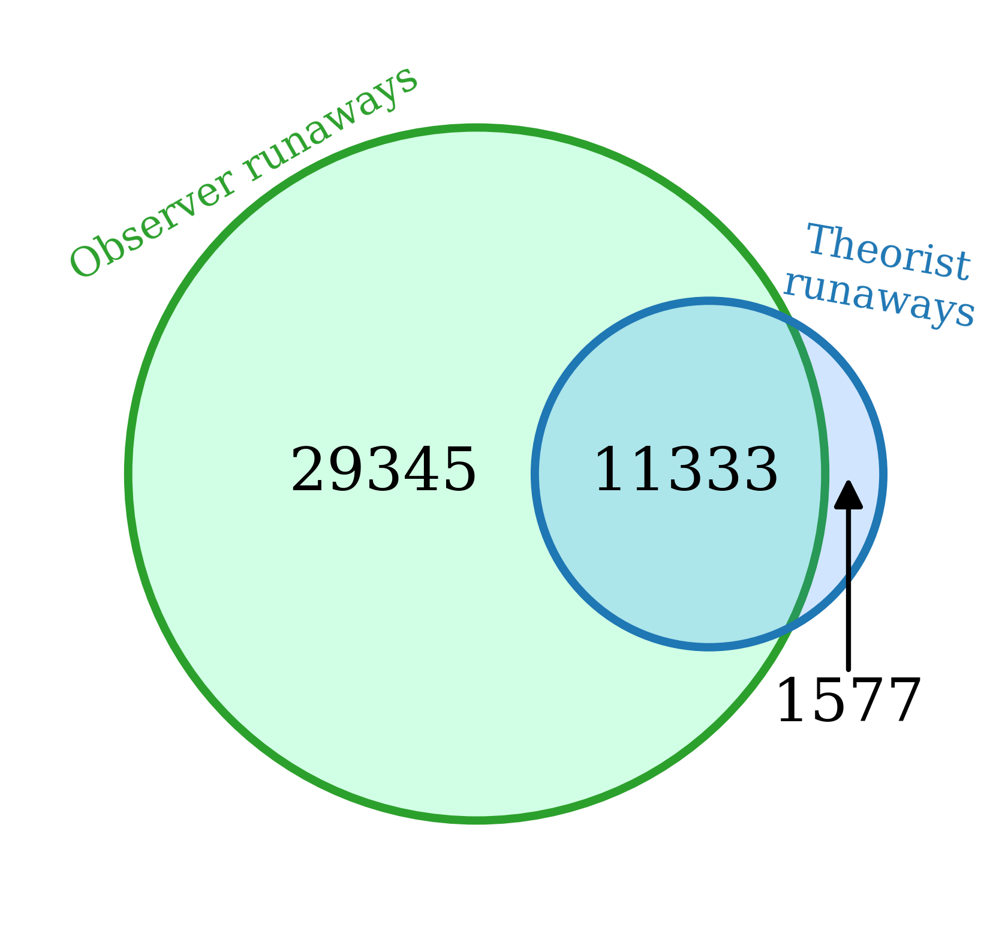

In [64]:
fig, ax = plt.subplots(figsize=(10, 10))

circles = [
    mpl.patches.Circle((0,0), 15, facecolor=(.1, 1, .5, 0.2), edgecolor="tab:green", linewidth=5),
    mpl.patches.Circle((10,0), 15/2, facecolor=(.1, .5, 1, 0.2), edgecolor="tab:blue", linewidth=5)
]

ax.annotate(f"Observer runaways", xy=(-10, 13), ha="center", va="center", fontsize=fs, color="tab:green", rotation=30)
ax.annotate(f"Theorist\nrunaways", xy=(17.5, 8.5), ha="center", va="center", fontsize=fs, color="tab:blue", rotation=-10)

intersect_count = len(np.intersect1d(theorist_still_hot, observer_runaway_pop.bin_nums))

ax.annotate(f"{len(observer_runaway_pop) - intersect_count}", xy=(-4, 0), ha="center", va="center", fontsize=1.5 * fs)
ax.annotate(f"{intersect_count}", xy=(9, 0), ha="center", va="center", fontsize=1.5 * fs)
ax.annotate(f"{len(theorist_still_hot) - intersect_count}", xy=(16, 0), xytext=(16, -10),
            ha="center", va="center", fontsize=1.5 * fs, arrowprops=dict(arrowstyle="-|>", lw=3, color="black"))

for c in circles:
    ax.add_artist(c)

ax.set(xlim=(-20, 20), ylim=(-20, 20))
ax.axis("off")
plt.show()

# Distributions of different pops

## Velocities

In [65]:
both_nums = np.intersect1d(theorist_still_hot, observer_runaway_pop.bin_nums)

In [66]:
just_theorist = np.setdiff1d(theorist_still_hot, both_nums)
just_obs = np.setdiff1d(observer_runaway_pop.bin_nums, both_nums)

In [67]:
just_theorist_pop = p[just_theorist]

In [68]:
just_obs_pop = p[just_obs]

### Theorist plot

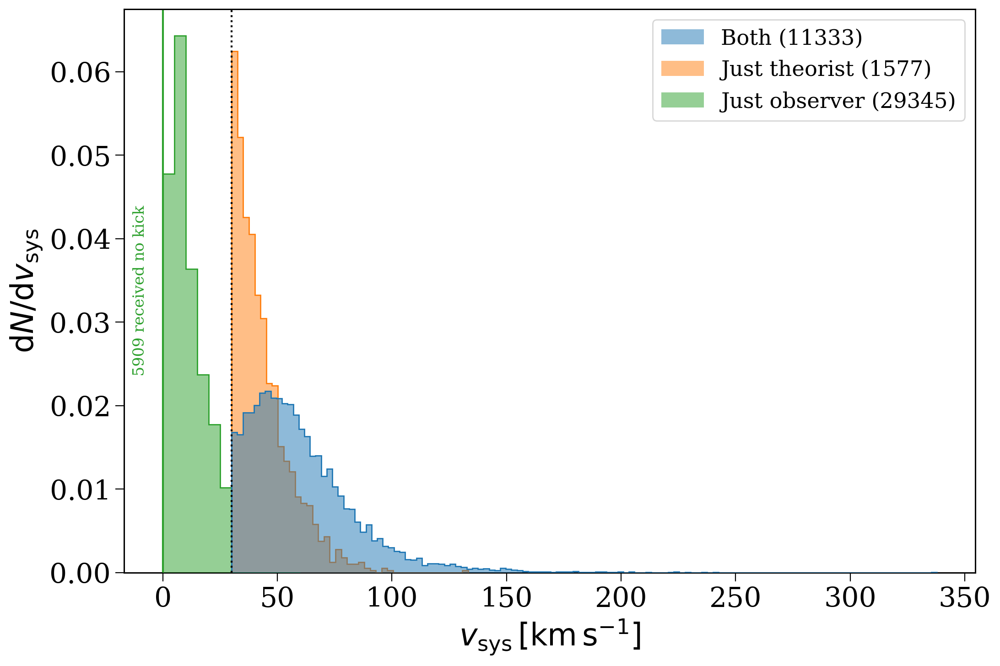

In [79]:
fig, ax = plt.subplots()

for nums, label, zorder, bins, c in zip([both_nums, just_theorist, just_obs], 
                                        ["Both", "Just theorist", "Just observer"],
                                        [10, 5, 5],
                                        ["fd", "fd", np.concatenate((np.arange(0.0, 30 + 5, 5), np.arange(31, 60 + 1, 1)))],
                                        ["C0", "C1", "C2"]):
    kicks = p.kick_info.loc[nums].drop_duplicates(subset="bin_num", keep="first")
    mag = kicks["natal_kick"].values
    v_sys = kicks["vsys_1_total"].values
    v_sys[kicks["disrupted"] == 1] = kicks["vsys_2_total"][kicks["disrupted"] == 1].values
    
    n_no_kick = (v_sys == 0).sum()
    
    v_sys = v_sys[v_sys != 0]
    ax.hist(v_sys, label=label + f" ({len(mag)})", zorder=zorder, bins=bins, alpha=0.5, density=True, color=c)
    ax.hist(v_sys, histtype="step", zorder=zorder, bins=bins, density=True, color=c)

if n_no_kick > 0:
    ax.axvline(0.0, color="C2")
    ax.annotate(f'{n_no_kick} received no kick', xy=(0.01, 0.5), xycoords="axes fraction", ha="left", va="center", rotation=90, color="C2", fontsize=0.5* fs)
    
ax.legend(fontsize=0.7*fs)

ax.axvline(30, color="black", linestyle="dotted", zorder=100)

ax.set(xlabel=r"$v_{\rm sys} \, [\rm km \, s^{-1}]$", ylabel=r"$\mathrm{d}N/\mathrm{d}v_{\rm sys}$")

plt.show()

### Observer plot

In [72]:
v_circ = p.galactic_potential.circular_velocity(p.final_pos.T)

In [75]:
final_vel_cyl = get_final_vel_cylindrical(p)
rel_vel = np.linalg.norm([final_vel_cyl[:, 0], final_vel_cyl[:, 1] - v_circ, final_vel_cyl[:, 2]], axis=0)

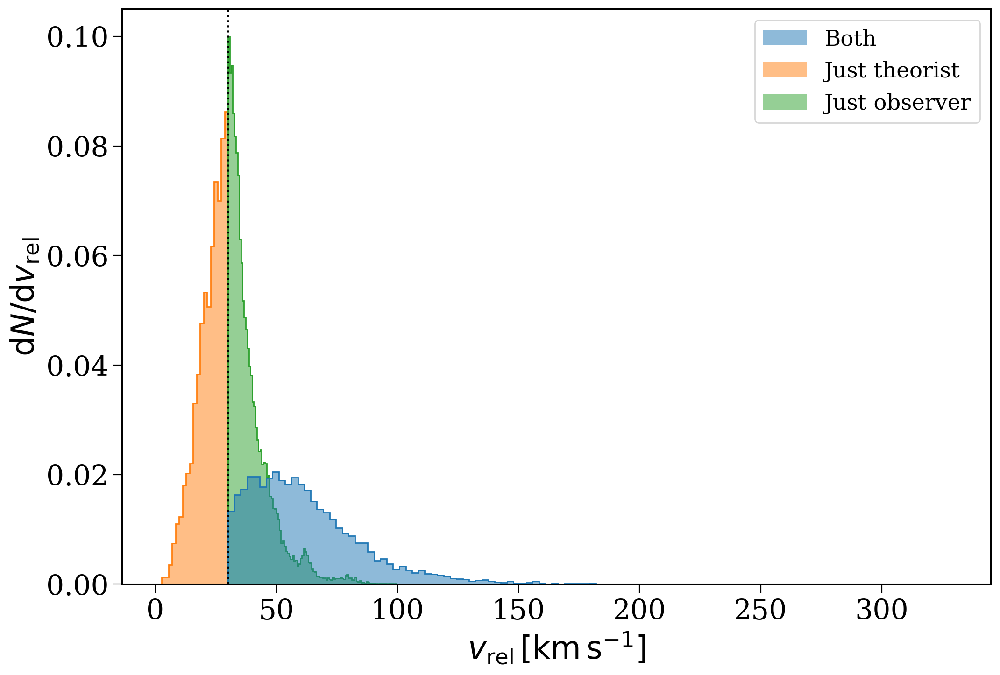

In [76]:
fig, ax = plt.subplots()

for nums, label, zorder, bins, c in zip([both_nums, just_theorist, just_obs], 
                                        ["Both", "Just theorist", "Just observer"],
                                        [10, 5, 5],
                                        ["fd", "fd", "fd"],
                                        ["C0", "C1", "C2"]):
    final_bpp = p.final_bpp.loc[nums]
    disrupted = final_bpp["sep"] < 0
    
    vels = np.concatenate((rel_vel[len(p):][np.isin(p.bin_nums[p.disrupted], nums[disrupted])],
                           rel_vel[:len(p):][np.isin(p.bin_nums, nums[~disrupted])]))

    ax.hist(vels, label=label, zorder=zorder, bins=bins, alpha=0.5, density=True, color=c)
    ax.hist(vels, histtype="step", zorder=zorder, bins=bins, density=True, color=c)
    
ax.legend(fontsize=0.7*fs)

ax.axvline(30, color="black", linestyle="dotted", zorder=100)

ax.set(xlabel=r"$v_{\rm rel} \, [\rm km \, s^{-1}]$", ylabel=r"$\mathrm{d}N/\mathrm{d}v_{\rm rel}$")

plt.show()

### Observers at birth

In [86]:
v_circ_init = observer_runaway_pop.galactic_potential.circular_velocity(observer_runaway_pop.initial_galaxy.positions)

In [92]:
rel_vel_init = np.linalg.norm([observer_runaway_pop.initial_galaxy.v_R,
                               observer_runaway_pop.initial_galaxy.v_T - v_circ_init,
                               observer_runaway_pop.initial_galaxy.v_z], axis=0)

In [112]:
from cosmic.sample.sampler import independent

In [140]:
(independent.get_independent_sampler(
    list(range(16)), list(range(16)),
    primary_model="kroupa01", ecc_model="sana12", porb_model="sana12",
    SF_start=10000, SF_duration=0, binfrac_model=0.5, met=0.02,
    total_mass=1e4,
    sampling_target="total_mass",
    trim_extra_samples=True
)[0]["mass_1"] > 7).sum()

np.int64(54)

In [111]:
(rel_vel_init > 70).sum()

np.int64(482)

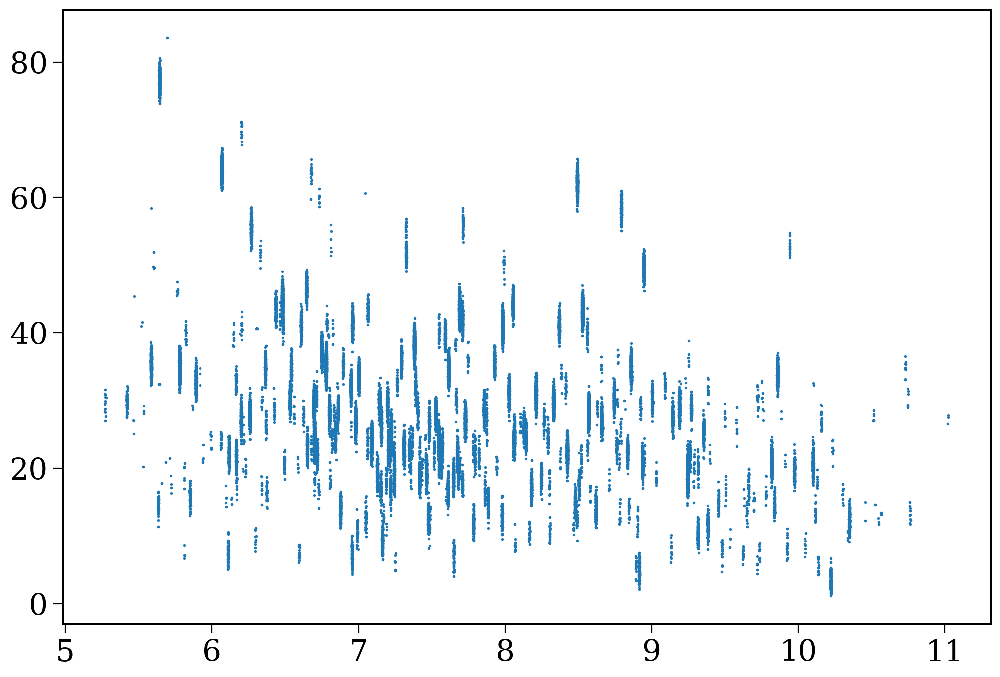

In [109]:
plt.scatter(observer_runaway_pop.initial_galaxy.rho, rel_vel_init, s=1)

In [143]:
s = cogsworth.sfh.SandersBinney2015(100000, potential=p.galactic_potential)

In [147]:
s_v_circ_init = p.galactic_potential.circular_velocity(s.positions)

In [148]:
s_vel_rel = np.linalg.norm([s.v_R, s.v_T - s_v_circ_init, s.v_z], axis=0)

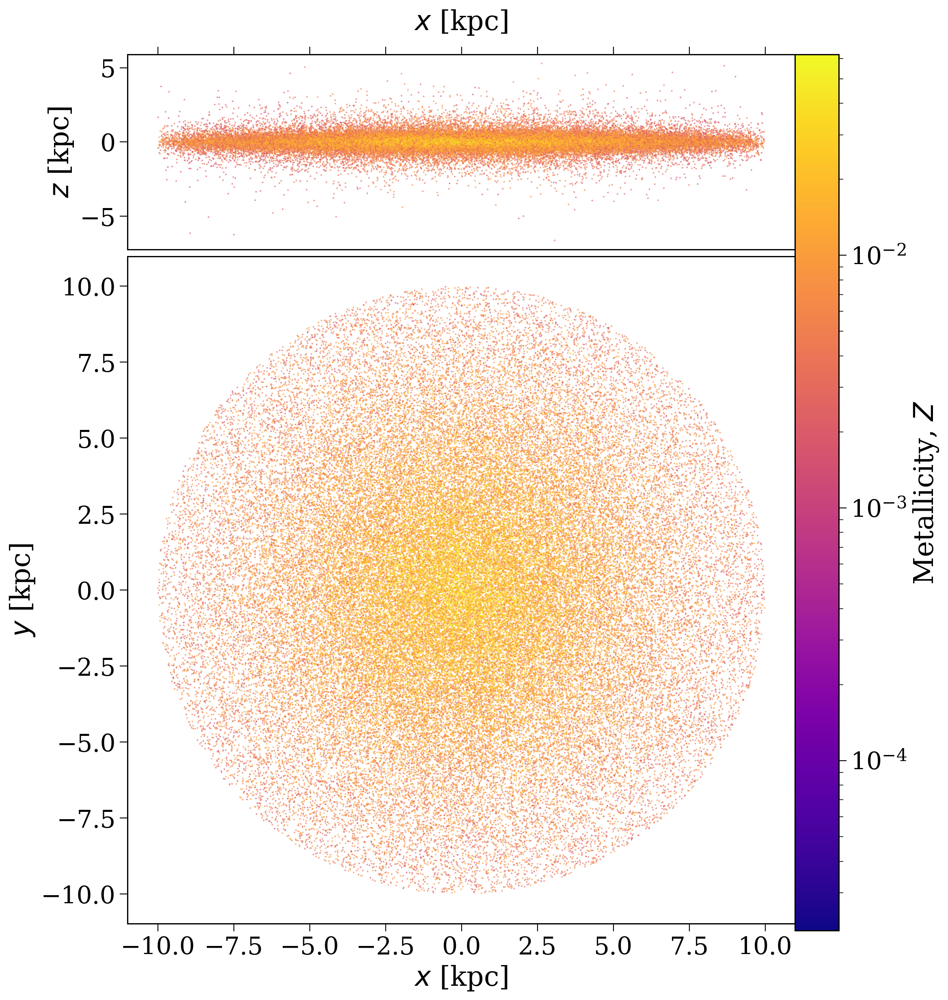

(<Figure size 1247.5x1400 with 3 Axes>,
 array([<Axes: xlabel='$x$ [kpc]', ylabel='$z$ [kpc]'>,
        <Axes: xlabel='$x$ [kpc]', ylabel='$y$ [kpc]'>], dtype=object))

In [155]:
s[s.rho < 10 * u.kpc].plot()

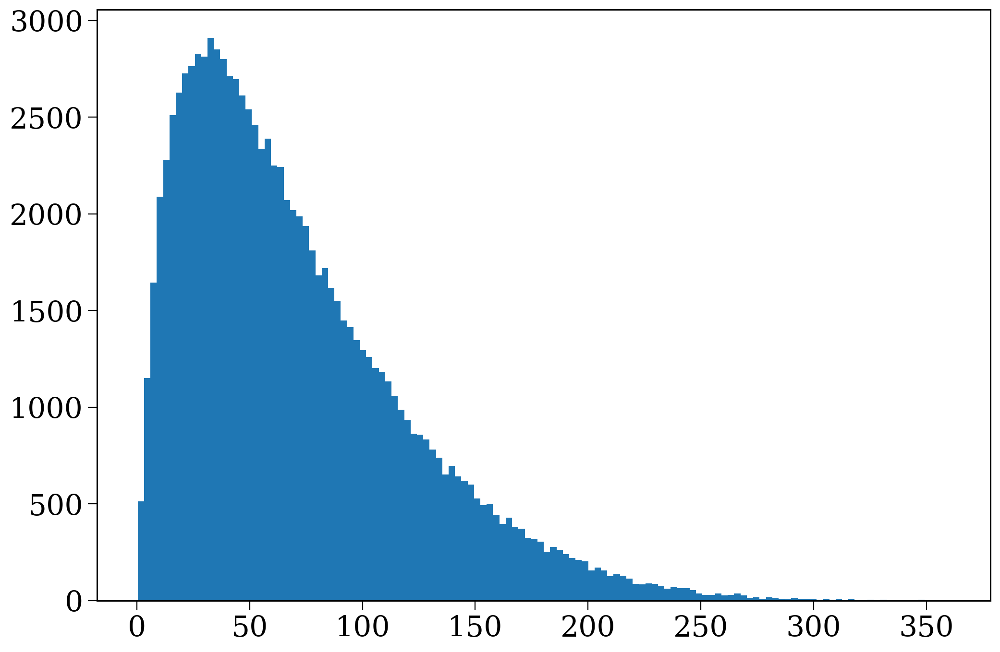

In [149]:
plt.hist(s_vel_rel, bins="fd");

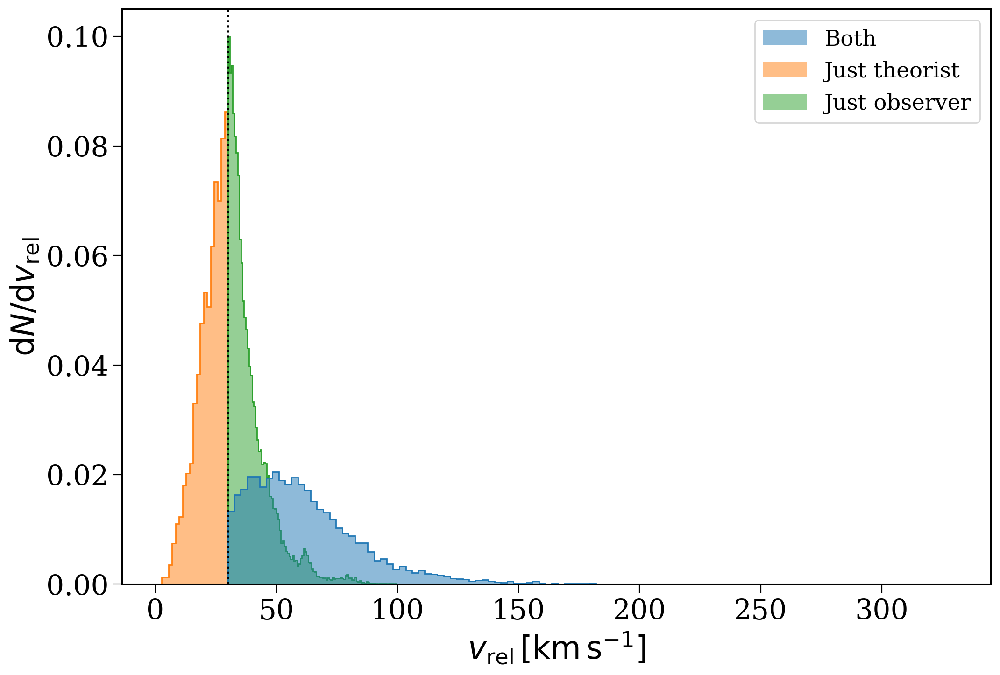

In [ ]:
fig, ax = plt.subplots()

for nums, label, zorder, bins, c in zip([both_nums, just_theorist, just_obs], 
                                        ["Both", "Just theorist", "Just observer"],
                                        [10, 5, 5],
                                        ["fd", "fd", "fd"],
                                        ["C0", "C1", "C2"]):
    final_bpp = p.final_bpp.loc[nums]
    disrupted = final_bpp["sep"] < 0
    
    vels = np.concatenate((rel_vel[len(p):][np.isin(p.bin_nums[p.disrupted], nums[disrupted])],
                           rel_vel[:len(p):][np.isin(p.bin_nums, nums[~disrupted])]))

    ax.hist(vels, label=label, zorder=zorder, bins=bins, alpha=0.5, density=True, color=c)
    ax.hist(vels, histtype="step", zorder=zorder, bins=bins, density=True, color=c)
    
ax.legend(fontsize=0.7*fs)

ax.axvline(30, color="black", linestyle="dotted", zorder=100)

ax.set(xlabel=r"$v_{\rm rel} \, [\rm km \, s^{-1}]$", ylabel=r"$\mathrm{d}N/\mathrm{d}v_{\rm rel}$")

plt.show()

## Positions

In [222]:
hot_theorists = p[theorist_still_hot]

In [223]:
ht_pos = np.concatenate((hot_theorists.final_pos[:len(hot_theorists)][~hot_theorists.disrupted],
                         hot_theorists.final_pos[len(hot_theorists):]))

In [224]:
ht_nums = np.concatenate((hot_theorists.bin_nums[~hot_theorists.disrupted],
                          hot_theorists.bin_nums[hot_theorists.disrupted]))

In [225]:
ht_init_pos = hot_theorists.initial_galaxy.positions[:, np.argsort(ht_nums)].T

In [226]:
np.sum(ht_init_pos[:, :2]**2, axis=1)**(0.5)

<Quantity [10.01980109,  7.7972852 , 10.01545048, 10.01872233,  7.79696196,
           10.63760381, 10.63963086,  9.92176878,  9.91833969, 10.01520286,
            9.64002584,  9.92122534,  9.92070468,  9.64038269, 10.10262111,
            9.91839915,  8.4081207 ,  8.40814984,  8.40912356,  6.7981093 ,
           10.10263242, 10.0997137 ,  8.79776727,  8.30489452,  8.79750818,
           10.0166618 , 10.01772296, 10.01734387, 10.01572704, 10.01965723,
           10.01676482, 10.01898904,  8.30356523] kpc>

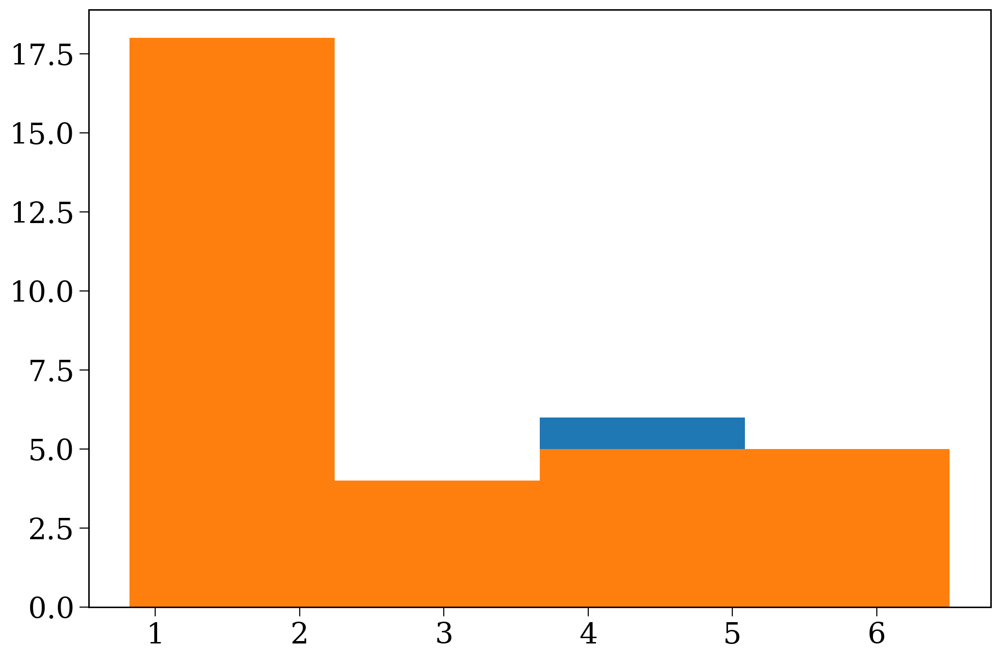

In [227]:
plt.hist(np.sum((ht_init_pos - ht_pos)**2, axis=1)**(.5), bins="fd")
plt.hist((np.sum((ht_init_pos - ht_pos)**2, axis=1)**(.5))[~np.isin(ht_nums, just_theorist)], bins="fd");

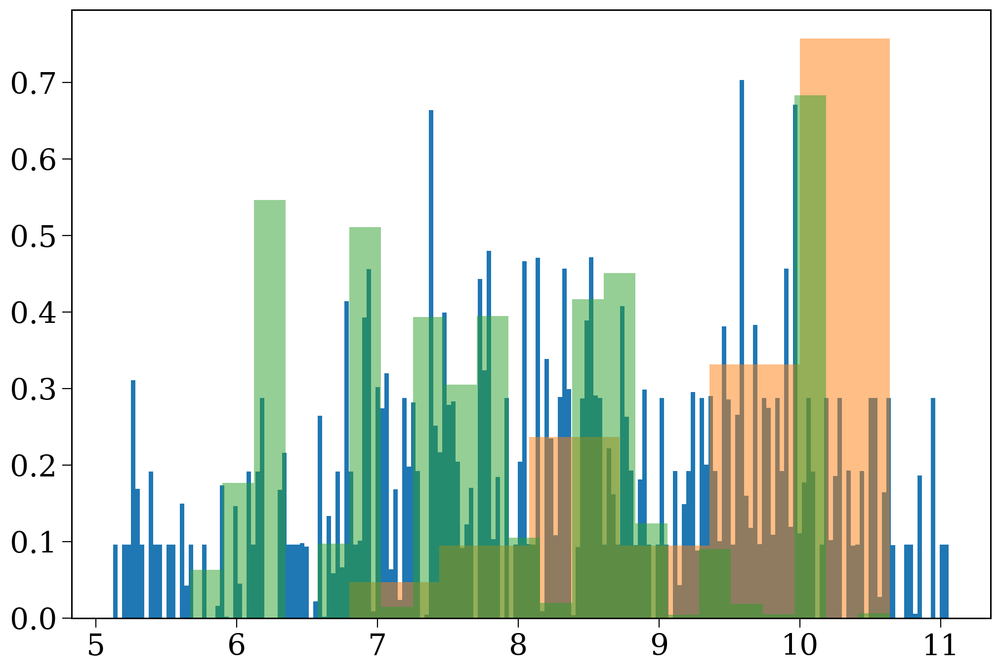

In [228]:
plt.hist(p.initial_galaxy.rho, bins="fd", density=True);
plt.hist(hot_theorists.initial_galaxy.rho, bins="fd", density=True, alpha=0.5);
plt.hist(observer_runaway_pop.initial_galaxy.rho, bins="fd", density=True, alpha=0.5);

In [123]:
pd.read_hdf("slurm/bad_orbits.h5", key='bpp').drop_duplicates(subset="bin_num", keep="last")

,tphys,mass_1,mass_2,kstar_1,kstar_2,sep,porb,ecc,RRLO_1,RRLO_2,evol_type,aj_1,aj_2,tms_1,tms_2,massc_1,massc_2,rad_1,rad_2,mass0_1,mass0_2,lum_1,lum_2,teff_1,teff_2,radc_1,radc_2,menv_1,menv_2,renv_1,renv_2,omega_spin_1,omega_spin_2,B_1,B_2,bacc_1,bacc_2,tacc_1,tacc_2,epoch_1,epoch_2,bhspin_1,bhspin_2,bin_num
16739,51.254353,0.000000,1.324762,15.0,13.0,0.000000,0.000000,-1.000000,-1.000000e+00,0.000100,10.0,10.687139,0.000243,3.198348e+01,1.000000e+10,0.000000,1.324762,0.204127,0.000014,0.844208,12.395026,1.677547e+02,2.414695,4.618362e+04,1.931618e+06,0.000000,0.000014,8.442084e-01,1.000000e-10,2.041271e-01,1.000000e-10,1.921667e+01,3.628045e+09,0.000000e+00,7.634565e+11,0.0,0.0,0.0,0.0,38.779365,51.254110,0.0,0.0,16739
18040,4.160893,15.347715,41.488036,14.0,4.0,39848.764226,122287.944138,0.019944,5.610818e-09,0.115269,10.0,0.011894,4.370198,1.000000e+10,4.319625e+00,15.347715,19.143399,0.000065,2101.503624,15.987690,48.907515,1.000000e-10,814266.881892,2.272819e+03,3.799236e+03,0.000065,1.410029,1.000000e-10,1.224768e+01,1.000000e-10,1.807003e+03,1.716642e+09,9.826552e-04,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,4.148999,-0.209305,0.0,0.0,18040
20040,48.344928,0.000000,1.284621,15.0,13.0,0.000000,0.000000,-1.000000,-1.000000e+00,0.000100,10.0,7.827311,0.092720,1.000000e+10,1.000000e+10,0.000000,1.284621,0.007326,0.000014,1.064327,12.125319,2.303191e-01,2.365425,4.692750e+04,1.921688e+06,0.007326,0.000014,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,2.470203e+01,1.751699e+08,0.000000e+00,8.405856e+12,0.0,0.0,0.0,0.0,40.340960,48.252208,0.0,0.0,20040
26491,42.561771,1.277584,0.000000,13.0,15.0,0.000000,0.000000,-1.000000,1.000000e-04,-1.000000,10.0,0.000732,38.759720,1.000000e+10,4.034210e+03,1.277584,0.000000,0.000014,1.328831,8.715202,1.343115,2.356735e+00,2.631833,1.919921e+06,6.406183e+03,0.000014,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,2.041699e-07,2.262366e+08,4.545142e+01,2.204737e+12,0.000000e+00,0.0,0.0,0.0,0.0,42.561038,0.000493,0.0,0.0,26491
33644,42.570628,0.000000,1.979672,15.0,13.0,0.000000,0.000000,-1.000000,-1.000000e+00,0.000100,10.0,7.418985,0.021337,6.970928e+00,1.000000e+10,0.000000,1.979672,1.125518,0.000014,1.634784,15.958738,7.408290e+03,3.160440,5.070175e+04,2.066058e+06,0.047168,0.000014,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,1.438530e+01,2.581345e+08,0.000000e+00,1.113358e+12,0.0,0.0,0.0,0.0,34.106013,42.549290,0.0,0.0,33644
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3292657,14.309067,1.620043,6.010916,13.0,1.0,-1.000000,-1.000000,-1.000000,1.000000e-04,0.000100,10.0,0.029294,14.080554,1.000000e+10,6.810539e+01,1.620043,0.000000,0.000014,3.231032,14.585040,6.010916,2.763203e+00,1128.092812,1.997831e+06,1.869327e+04,0.000014,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,2.965681e+08,3.562958e+03,7.859833e+12,0.000000e+00,0.0,0.0,0.0,0.0,14.279773,0.228513,0.0,0.0,3292657
3298910,15.051129,1.499746,10.448325,13.0,1.0,-1.000000,-1.000000,-1.000000,1.000000e-04,0.000100,10.0,0.041749,14.060384,1.000000e+10,2.195595e+01,1.499746,0.000000,0.000014,6.269876,13.727286,10.448325,2.623988e+00,10672.093413,1.972178e+06,2.353437e+04,0.000014,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,1.192124e+08,1.046269e+03,3.844430e+13,0.000000e+00,0.0,0.0,0.0,0.0,15.009380,0.990745,0.0,0.0,3298910
3301757,22.035694,1.277584,7.628439,13.0,1.0,-1.000000,-1.000000,-1.000000,1.000000e-04,0.000100,10.0,0.015663,22.138858,1.000000e+10,3.970886e+01,1.277584,0.000000,0.000014,5.003652,10.630427,7.628439,2.356735e+00,3445.184346,1.919921e+06,1.985771e+04,0.000014,0.000000,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,2.523968e+08,1.516880e+03,2.394998e+12,0.000000e+00,0.0,0.0,0.0,0.0,22.020031,-0.103164,0.0,0.0,3301757
3303044,11.372754,1.287185,21.430763,13.0,1.0,-1.000000,-1.000000,-1.000000,1.000000e-04,0.000100,10.0,0.059335,2.

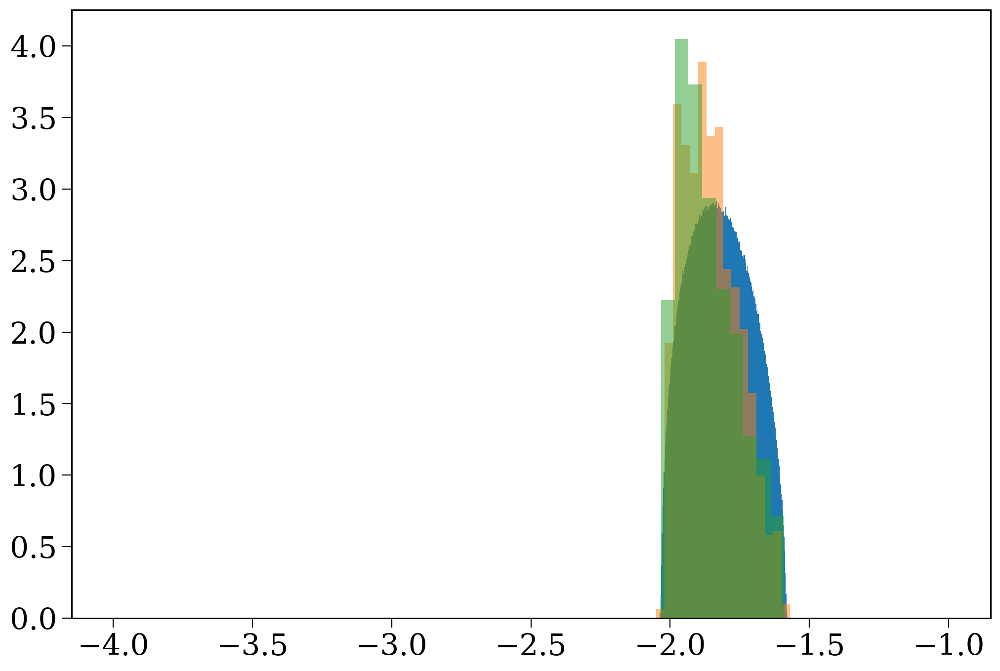

In [35]:
plt.hist(np.log10(p.initial_galaxy.Z), bins="fd", density=True, range=(-4, -1));
plt.hist(np.log10(hot_theorists.initial_galaxy.Z), bins="fd", density=True, alpha=0.5, range=(-4, -1));
plt.hist(np.log10(observer_runaway_pop.initial_galaxy.Z), bins="fd", density=True, alpha=0.5, range=(-4, -1));

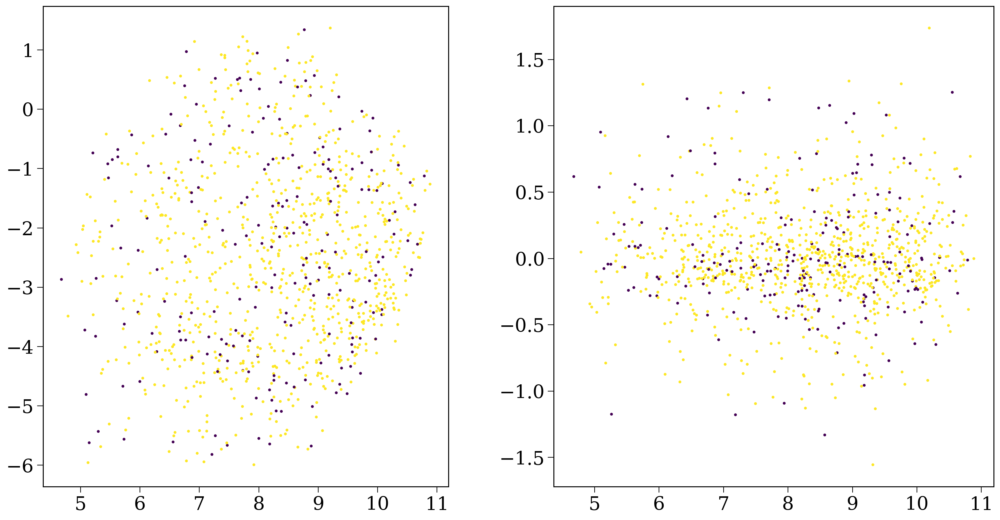

In [124]:
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

axes[0].scatter(ht_init_pos[:, 0], ht_init_pos[:, 1], s=5, c=np.isin(ht_nums, just_theorist))
axes[1].scatter(ht_init_pos[:, 0], ht_init_pos[:, 2], s=5, c=np.isin(ht_nums, just_theorist))

for ax in axes:
    axes[0].set_aspect("equal")

plt.show()

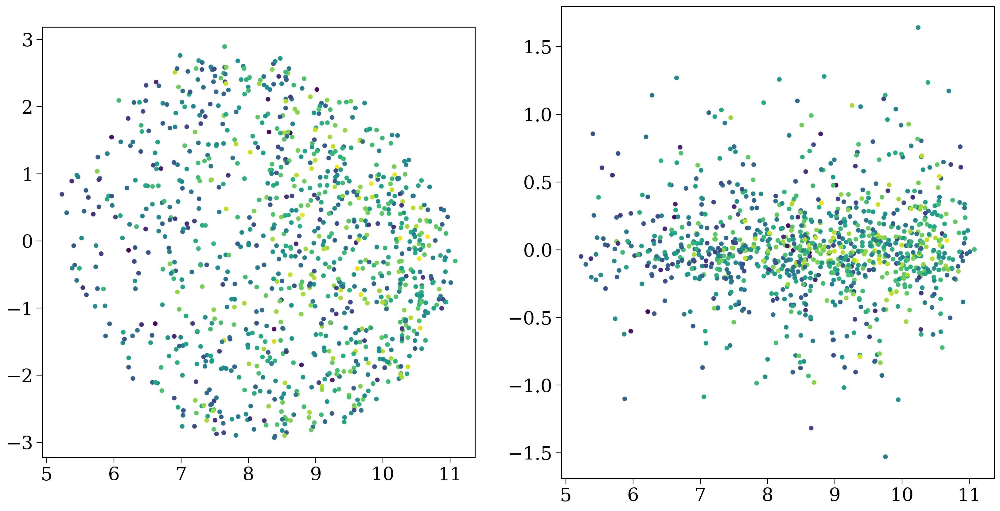

In [125]:
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

axes[0].scatter(ht_pos[:, 0], ht_pos[:, 1], s=20, c=np.log10(hot_theorists.final_bpp["tphys"].loc[ht_nums]))
axes[1].scatter(ht_pos[:, 0], ht_pos[:, 2], s=20, c=np.log10(hot_theorists.final_bpp["tphys"].loc[ht_nums]))

for ax in axes:
    axes[0].set_aspect("equal")

plt.show()

## TODO: Relative galactocentric radius

In [130]:
def get_radius_difference(p):
    print(p.disrupted.sum() / len(p))
    
    initial_r = ((p.initial_galaxy.x**2 + p.initial_galaxy.y**2)**(0.5))[p.disrupted]
    final_r = np.linalg.norm(p.final_pos[len(p):, :2], axis=1)
    return initial_r, final_r

In [154]:
just_theorist_pop.store_entire_orbits = True

In [193]:
just_theorist_pop.orbits[len(just_theorist_pop)].vel.d_xyz.to(u.km/u.s)[:, 72:76]

<Quantity [[ 18.99245033,  -1.75276349,  -2.37003481,  -2.98771693],
           [224.62962804, 230.33549863, 230.38871531, 230.44023776],
           [  2.01918556,  31.19842516,  31.27568925,  31.35240248]] km / s>

In [206]:
rel_vel[np.concatenate((p.bin_nums, p.bin_nums[p.disrupted])) == 2260]

<Quantity [380.21855916,   6.19005563] km / s>

In [201]:
rel_vel

<Quantity [ 80.08103874, 213.54561281,   1.30912197, ...,   2.21787366,
            11.73341008, 292.95517695] km / s>

In [ ]:
np.abs(np.sum(p.final_vel**2, axis=1)**(0.5) - v_circ)

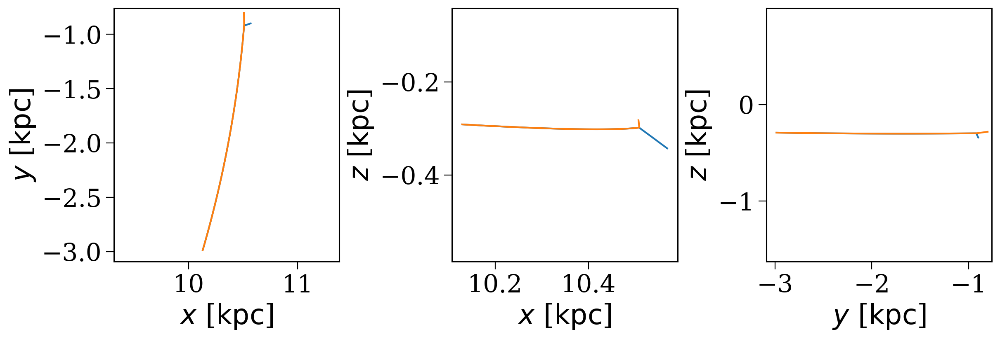

In [191]:
fig = just_theorist_pop.orbits[0][:75].plot();
just_theorist_pop.orbits[len(just_theorist_pop)].plot(axes=fig.axes);

In [147]:
just_theorist_pop.kick_info

,star,disrupted,natal_kick,phi,theta,mean_anomaly,delta_vsysx_1,delta_vsysy_1,delta_vsysz_1,vsys_1_total,delta_vsysx_2,delta_vsysy_2,delta_vsysz_2,vsys_2_total,delta_theta_total,omega,randomseed,bin_num
2260,1.0,1.0,473.358498,17.581122,186.320808,0.000000,138.409543,367.660255,420.986818,575.813481,-3.544363,-15.241082,-32.235604,35.832768,0.000000,0.000000,-3.143252e+08,2260.0
2260,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,2260.0
12689,1.0,1.0,710.627547,48.039900,94.696763,0.000000,162.119763,385.921782,-232.872121,479.007165,-33.175993,6.883019,-13.456057,36.456658,0.000000,0.000000,-1.164514e+09,12689.0
12689,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,12689.0
17815,1.0,1.0,740.955949,30.555122,20.282079,0.000000,-43.595943,386.212817,-88.042617,398.512796,-7.321261,33.845277,12.154487,36.699253,0.000000,0.000000,-1.618857e+06,17815.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3294677,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,3294677.0
3307172,1.0,1.0,523.347071,-18.989023,33.016829,0.000000,-21.761270,140.758079,97.928482,172.847844,-11.392656,37.076061,9.090642,39.838005,0.000000,0.000000,-2.538712e+07,3307172.0
3307172,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,3307172.0
3307673,1.0,0.0,270.662182,11.603026,69.038365,226.500642,10.104347,-9.573626,-27.492040,30.815003,0.000000,0.000000,-0.000000,0.000000,18.623627,56.877116,-1.272039e+09,3307673.0


In [145]:
just_theorist_pop.initial_galaxy.rho[0]

<Quantity 10.56017923 kpc>

In [144]:
np.linalg.norm(just_theorist_pop.final_pos[len(just_theorist_pop):, :2][0])

<Quantity 10.53819789 kpc>

0.8907766990291263


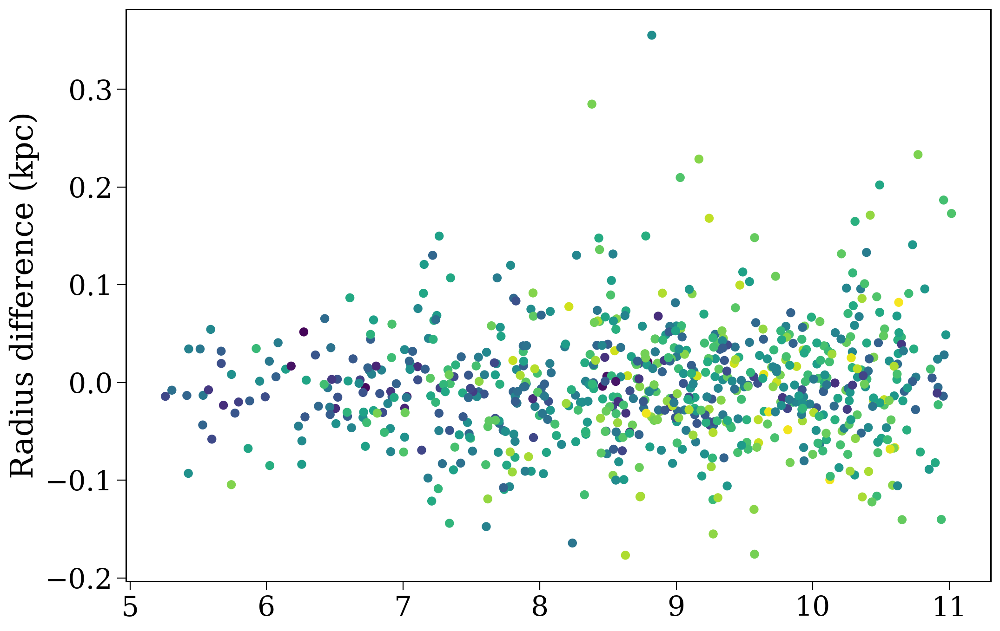

0.75


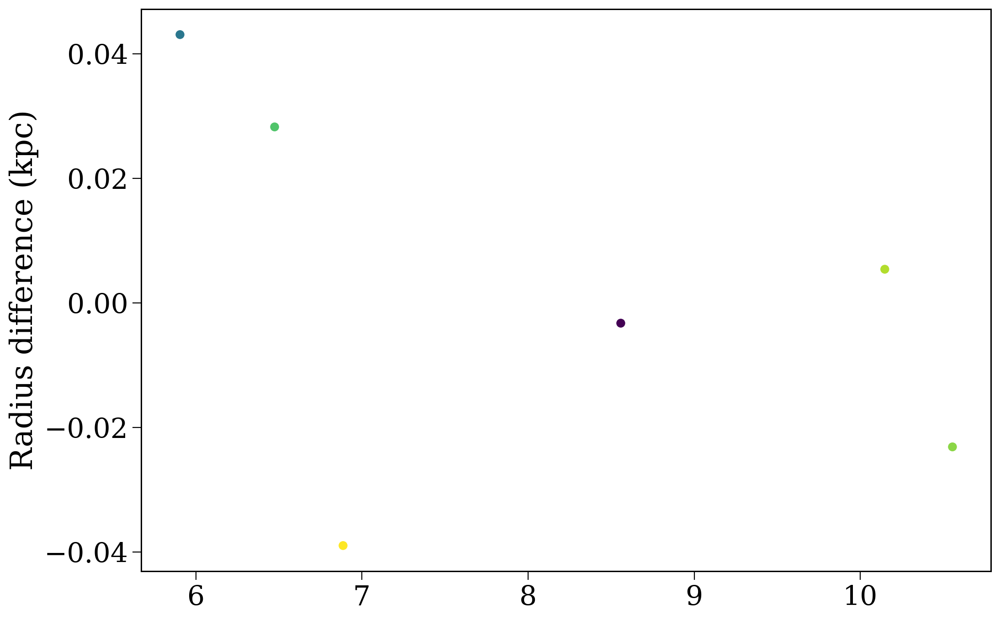

In [131]:
for thing in [just_theorist_pop, just_obs_pop]:
    initial_r, final_r = get_radius_difference(thing)
    plt.scatter(initial_r, initial_r - final_r, c=np.log10(thing.final_bpp[thing.disrupted]["tphys"]), label="Just theorist")
    plt.ylabel("Radius difference (kpc)")
    plt.show()

In [83]:
import gala.potential as gp

In [84]:
x_range = np.linspace(0, 30, 1000) * u.kpc
mw_v_circ = gp.MilkyWayPotential2022().circular_velocity(q=[x_range, np.zeros_like(x_range), np.zeros_like(x_range)])

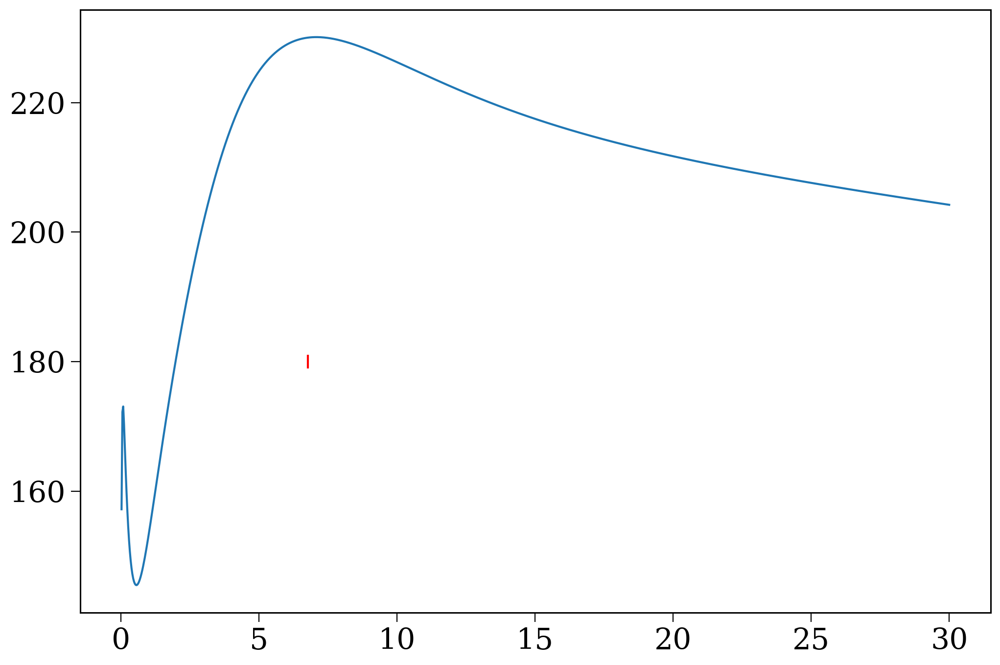

In [85]:
plt.plot(x_range, mw_v_circ)

test = get_radius_difference(just_obs_pop)[0]
plt.scatter(test, [180] * len(test), s=100, color='r', marker='|')

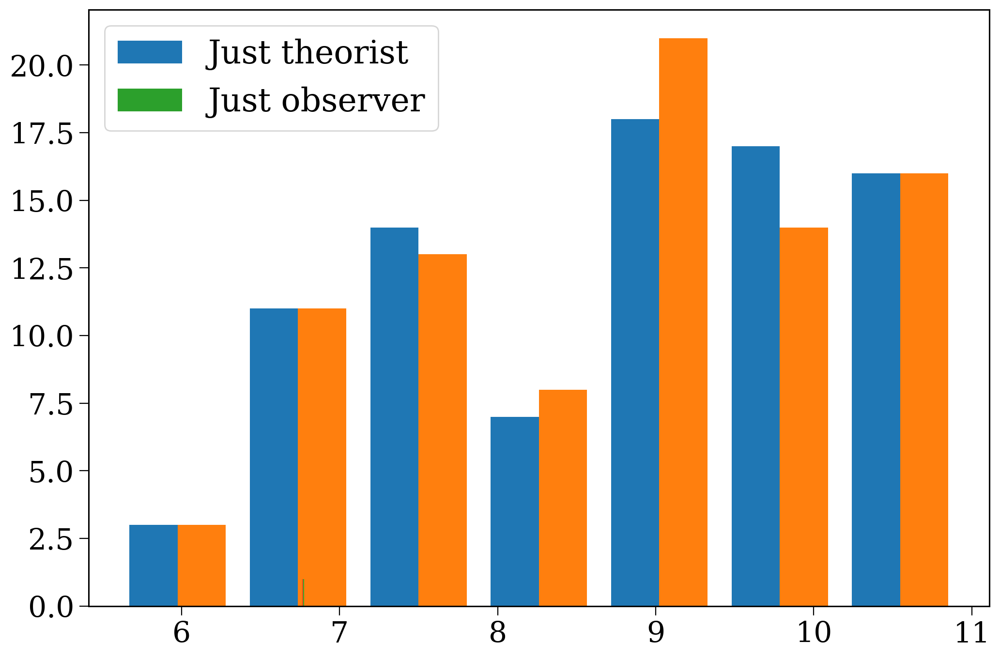

In [86]:
plt.hist(get_radius_difference(just_theorist_pop), bins="fd", label="Just theorist");
plt.hist(get_radius_difference(just_obs_pop), bins="fd", label="Just observer");
plt.legend()

## TODO: Kick direction

In [134]:
def kick_gal_pop(p):
    
    kick_nums = p.kick_info[p.kick_info["star"] == 1]["bin_num"].values
    kick_xyzs = p.kick_info[p.kick_info["star"] == 1][["delta_vsysx_2", "delta_vsysy_2", "delta_vsysz_2"]].values
    phases = p.initC.loc[kick_nums]["phase_sn_1"].values
    incs = p.initC.loc[kick_nums]["inc_sn_1"].values
    
    return kick_gal_direction(kick_xyzs, phases, incs)
    

def kick_gal_direction(delta_v_sys_xyz, theta, phi):
    v_X = delta_v_sys_xyz[:, 0] * np.cos(theta) - delta_v_sys_xyz[:, 1] * np.sin(theta) * np.cos(phi)\
        + delta_v_sys_xyz[:, 2] * np.sin(theta) * np.sin(phi)
    v_Y = delta_v_sys_xyz[:, 0] * np.sin(theta) + delta_v_sys_xyz[:, 1] * np.cos(theta) * np.cos(phi)\
        - delta_v_sys_xyz[:, 2] * np.cos(theta) * np.sin(phi)
    v_Z = delta_v_sys_xyz[:, 1] * np.sin(phi) + delta_v_sys_xyz[:, 2] * np.cos(phi)
    return np.array([v_X, v_Y, v_Z])

In [146]:
y = kick_gal_pop(just_obs_pop)

In [149]:
y[:2, :]

array([[ -1.17696432, -13.53013499,   7.07565991,  -3.60209742,
         -9.74268666,  11.07443827,   0.21249401,   0.26800091,
         -9.07173998,   7.33895686, -18.78881634,  10.60080234,
         17.74218801,  24.86774198,   7.70144912, -21.91059399,
        -28.0394163 , -29.28427706,   4.63471717,  -0.90772826,
          2.52332955,   9.60600784,   6.66885153,   5.44844804,
        -22.96899056,  -3.20322234,   8.89098673,   6.19168333,
         -9.22548047, -11.84528369,   6.23682968, -23.84563839,
         10.90875879,  -6.57484353,  10.02882604,  16.04094628,
         -8.63170253,  23.00013068,  -1.18063655,  -3.07116994,
          0.        , -21.28887042,   0.        ,   0.        ],
       [-20.05111918, -14.6898263 ,   8.44710085,   6.538833  ,
         23.87832229,   2.83186333,   8.51098047,   4.66859998,
          3.90418932,  -7.79951615,  -5.3324617 ,  -3.54152786,
         -5.63443643,  12.76369553,  10.33441057,  13.058124  ,
          2.14179147,   1.11876765,  -3

## TODO: Initial pos/vel

In [43]:
just_obs_pop = observer_runaway_pop[just_obs]

In [82]:
obs_no_kick_pop = just_obs_pop[~np.isin(just_obs_pop.bin_nums,
                                        just_obs_pop.kick_info[just_obs_pop.kick_info["star"] != 0.0]["bin_num"])]

In [44]:
just_obs_pop.initial_galaxy.rho

<Quantity [ 1.51063647,  0.78750034,  1.5500156 ,  0.11121113,  0.78909854,
            0.78121877,  0.58607348,  1.07541354,  2.96035093,  0.51547775,
            1.79896031,  1.31914741,  1.00372323,  0.83573571,  2.41027104,
            1.14563462,  2.59839047,  0.88532805,  0.59993463,  1.86682857,
            1.31468369, 13.71028122,  0.66162754,  1.15625193,  2.87508537,
            9.82863898, 37.52287548,  0.99031538,  0.99250389,  1.8894931 ,
            1.2755582 ,  0.58276258, 14.30049899,  1.52129085,  0.99802196,
            1.26252062,  1.22035905,  0.66907071,  1.0051871 ,  1.71088776,
            0.61737626,  1.75457408,  1.02513702,  0.20314592,  0.57465208,
            9.88222667,  0.4784204 ,  2.89204086,  0.77453494,  0.86690127,
            1.9581295 ,  1.41136047,  2.27687048,  1.31119364,  1.42926834,
            7.59972996,  1.12847623,  1.8003094 ,  0.14523992,  0.9900236 ,
            6.56759625,  0.88515131,  1.59439825,  1.66904613, 11.32124634,
           1

In [115]:
hot_theorists.kick_info[hot_theorists.kick_info["star"] == 1]

,star,disrupted,natal_kick,phi,theta,mean_anomaly,delta_vsysx_1,delta_vsysy_1,delta_vsysz_1,vsys_1_total,delta_vsysx_2,delta_vsysy_2,delta_vsysz_2,vsys_2_total,delta_theta_total,omega,randomseed,bin_num
68,1.0,1.0,583.611455,-4.903116,111.921909,0.000000,421.462193,-185.350342,398.193807,608.722792,-9.812821,-22.124785,-24.951718,34.761844,0.000000,0.000000,-1.567868e+09,68.0
2393,1.0,1.0,550.811495,-73.747538,251.314530,0.000000,92.456456,-134.216574,-162.024186,229.813233,32.598491,11.105368,24.021496,41.988369,0.000000,0.000000,-1.340664e+08,2393.0
3021,1.0,1.0,621.308201,38.253031,56.804799,0.000000,-22.957363,227.052900,77.772991,241.098939,33.930183,6.129308,37.541829,50.972685,0.000000,0.000000,-7.651093e+08,3021.0
3098,1.0,1.0,564.904606,-52.768941,47.987401,0.000000,64.779665,12.116872,230.533490,239.768458,-27.546808,-21.377149,29.003639,45.354385,0.000000,0.000000,-4.928208e+08,3098.0
5138,1.0,1.0,508.215540,73.817396,250.248857,0.000000,-149.270835,-227.390279,97.719262,289.027984,-6.116800,38.821572,19.212821,43.745425,0.000000,0.000000,-1.246441e+09,5138.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3302537,1.0,1.0,581.880296,-65.918581,116.803122,0.000000,-43.617227,-228.400636,107.964098,256.369966,-34.154817,6.595555,2.384794,34.867465,0.000000,0.000000,-6.627540e+08,3302537.0
3302666,1.0,0.0,174.849344,-31.572475,28.957255,231.874952,22.076135,-19.553925,-6.399537,30.177240,0.000000,-0.000000,0.000000,0.000000,87.963945,87.416293,-5.857799e+08,3302666.0
3302691,1.0,1.0,301.740671,-35.740891,145.816212,0.000000,26.534407,-217.269415,-235.275344,321.348037,10.911199,22.525130,18.410250,31.070453,0.000000,0.000000,-1.329605e+09,3302691.0
3304068,1.0,1.0,624.822051,40.134077,234.883833,0.000000,178.376743,-262.296778,471.141242,567.971771,-25.243830,18.301749,1.386917,31.211032,0.000000,0.000000,-5.544534e+08,3304068.0


In [116]:
x = kick_gal_pop(hot_theorists)

(array([  3.,  23., 359., 825., 553., 219.,   8.,   4.,   0.,   1.]),
 array([-98.82245465, -73.22250615, -47.62255766, -22.02260917,
          3.57733933,  29.17728782,  54.77723631,  80.37718481,
        105.9771333 , 131.57708179, 157.17703029]),
 <BarContainer object of 10 artists>)

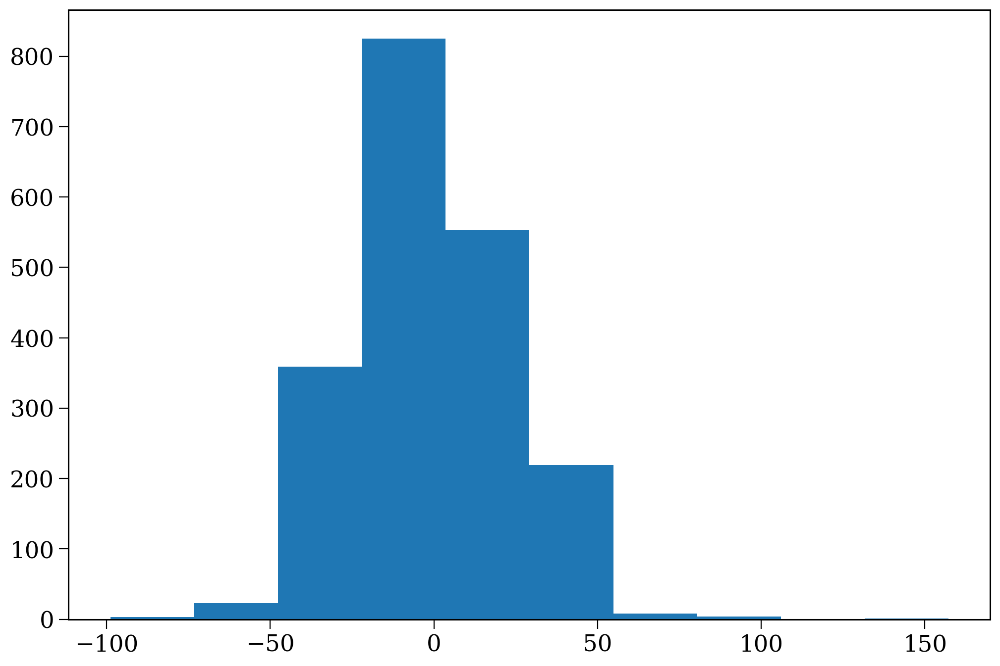

In [122]:
plt.hist(x[:, 2])

In [108]:
kick_gal_direction(hot_theorists.kick_info.loc[68].iloc[0][["delta_vsysx_2", "delta_vsysy_2", "delta_vsysz_2"]].values,
                   hot_theorists.initC.loc[68]["phase_sn_1"],
                   hot_theorists.initC.loc[68]["inc_sn_1"])

(-7.1672109528453465, -14.947827059261455, 30.554530243452334)

In [107]:
hot_theorists.initC.loc[68]["phase_sn_1"]

2.061025604396207

In [104]:
hot_theorists.kick_info.loc[68].iloc[0][["delta_vsysx_2", "delta_vsysy_2", "delta_vsysz_2"]].values

array([ -9.81282085, -22.12478459, -24.95171775])

In [92]:
hot_theorists.kick_info

,star,disrupted,natal_kick,phi,theta,mean_anomaly,delta_vsysx_1,delta_vsysy_1,delta_vsysz_1,vsys_1_total,delta_vsysx_2,delta_vsysy_2,delta_vsysz_2,vsys_2_total,delta_theta_total,omega,randomseed,bin_num
68,1.0,1.0,583.611455,-4.903116,111.921909,0.0,421.462193,-185.350342,398.193807,608.722792,-9.812821,-22.124785,-24.951718,34.761844,0.0,0.0,-1.567868e+09,68.0
68,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000e+00,68.0
2393,1.0,1.0,550.811495,-73.747538,251.314530,0.0,92.456456,-134.216574,-162.024186,229.813233,32.598491,11.105368,24.021496,41.988369,0.0,0.0,-1.340664e+08,2393.0
2393,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000e+00,2393.0
3021,1.0,1.0,621.308201,38.253031,56.804799,0.0,-22.957363,227.052900,77.772991,241.098939,33.930183,6.129308,37.541829,50.972685,0.0,0.0,-7.651093e+08,3021.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3302691,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000e+00,3302691.0
3304068,1.0,1.0,624.822051,40.134077,234.883833,0.0,178.376743,-262.296778,471.141242,567.971771,-25.243830,18.301749,1.386917,31.211032,0.0,0.0,-5.544534e+08,3304068.0
3304068,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000e+00,3304068.0
3307326,1.0,1.0,420.437902,-15.253214,316.972196,0.0,63.934793,68.905214,130.944198,161.189234,-13.431731,24.132703,-17.987108,32.959593,0.0,0.0,-1.835575e+08,3307326.0


In [88]:
obs_no_kick_pop.initial_galaxy.rho

<Quantity [0.78750034, 0.11121113, 0.78121877, 1.07541354, 0.51547775,
           0.83573571, 0.88532805, 1.86682857, 0.66162754, 0.99031538,
           0.58276258, 1.22035905, 1.75457408, 1.02513702, 0.20314592,
           0.57465208, 0.77453494, 1.41136047, 1.31119364, 1.42926834,
           1.12847623, 1.8003094 , 0.14523992, 1.66904613, 0.44645677,
           1.69812336] kpc>

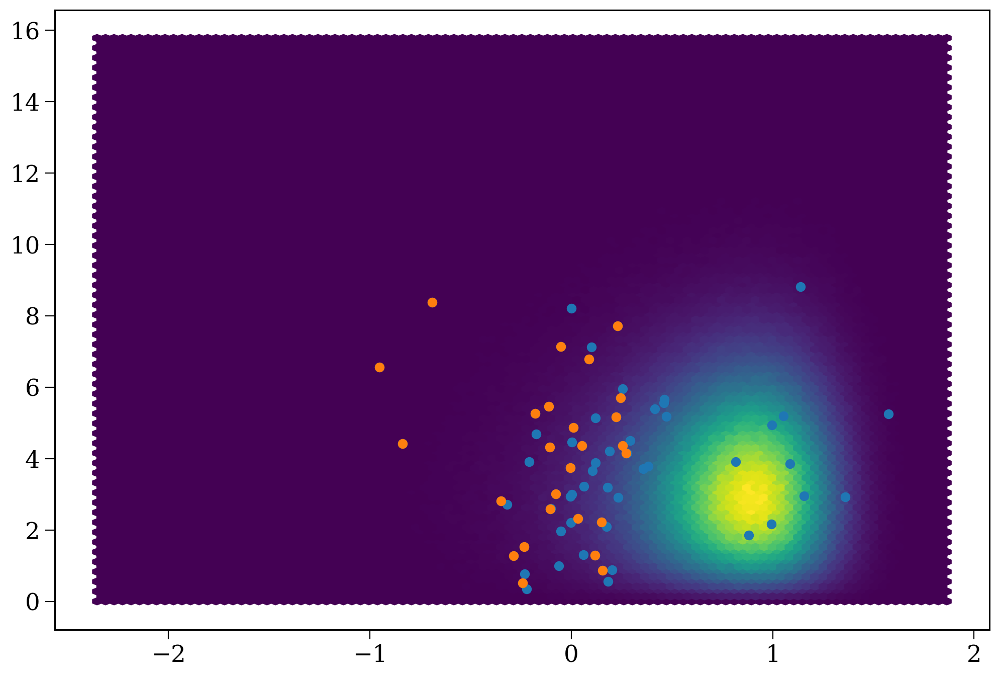

In [84]:
plt.hexbin(np.log10(p.initial_galaxy.rho.value), (p.initial_galaxy.v_R**2 + p.initial_galaxy.v_z**2)**(0.5))
plt.scatter(np.log10(just_obs_pop.initial_galaxy.rho.value), (just_obs_pop.initial_galaxy.v_R**2
                                                              + just_obs_pop.initial_galaxy.v_z**2)**(0.5))
plt.scatter(np.log10(obs_no_kick_pop.initial_galaxy.rho.value), (obs_no_kick_pop.initial_galaxy.v_R**2
                                                              + obs_no_kick_pop.initial_galaxy.v_z**2)**(0.5))

(array([0.00270829, 0.00270829, 0.06229069, 0.1164565 , 0.        ,
        0.        , 0.        , 0.        , 0.00270829, 0.00270829]),
 array([-16.87903722, -11.60422892,  -6.32942062,  -1.05461233,
          4.22019597,   9.49500426,  14.76981256,  20.04462086,
         25.31942915,  30.59423745,  35.86904575]),
 <BarContainer object of 10 artists>)

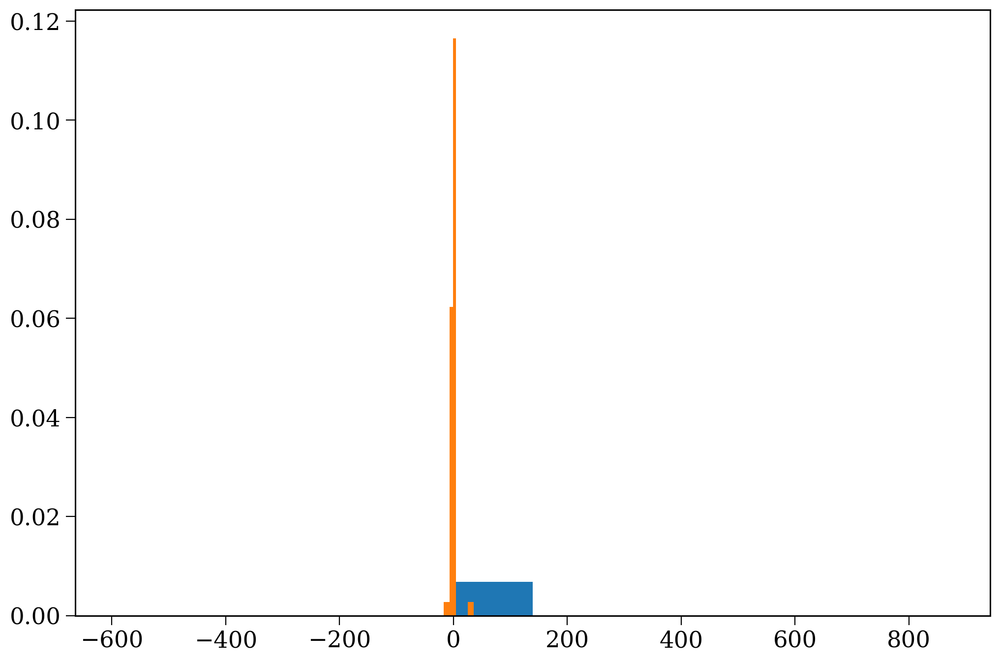

In [54]:
plt.hist(p.initial_galaxy.v_R / p.initial_galaxy.rho, density=True)
plt.hist(just_obs_pop.initial_galaxy.v_R / just_obs_pop.initial_galaxy.rho, density=True)

(array([10., 19., 16.,  9.,  3.,  3.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,
         0.,  0.,  1.,  0.,  0.,  0.,  2.,  0.,  0.,  1.,  0.,  1.,  0.,
         0.,  1.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([ 0.11121113,  0.61003332,  1.10885551,  1.6076777 ,  2.10649989,
         2.60532208,  3.10414427,  3.60296647,  4.10178866,  4.60061085,
         5.09943304,  5.59825523,  6.09707742,  6.59589961,  7.09472181,
         7.593544  ,  8.09236619,  8.59118838,  9.09001057,  9.58883276,
        10.08765495, 10.58647715, 11.08529934, 11.58412153, 12.08294372,
        12.58176591, 13.0805881 , 13.57941029, 14.07823249, 14.57705468,
        15.07587687, 15.57469906, 16.07352125, 16.57234344, 17.07116563,
        17.56998783, 18.06881002, 18.56763221, 19.0664544 , 19.5

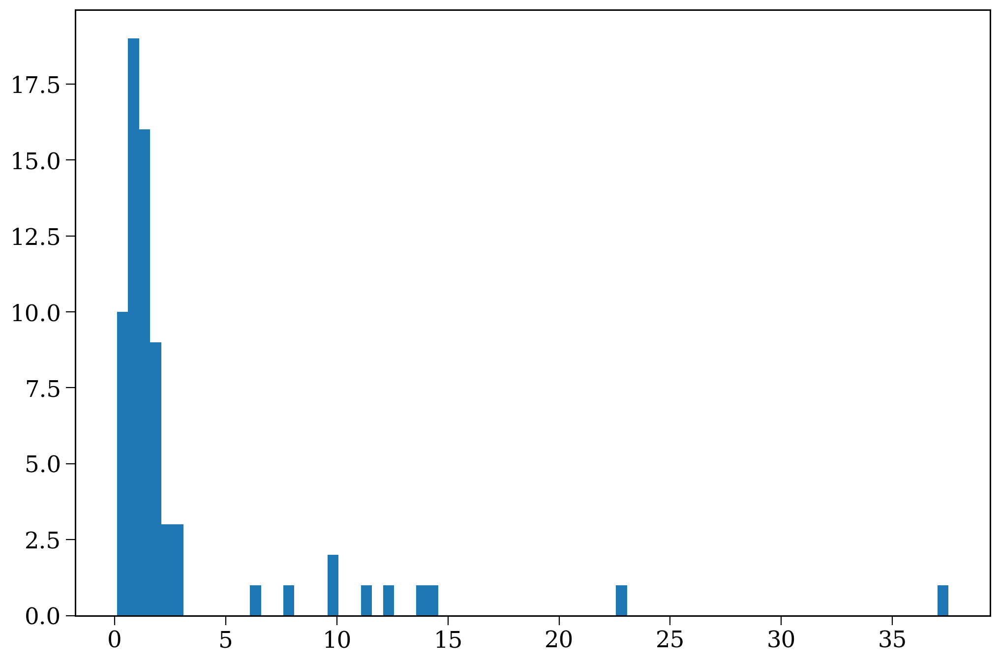

In [45]:
plt.hist(just_obs_pop.initial_galaxy.rho, bins="fd", density=False)
# plt.hist(theorist_runaway_pop[theorist_still_hot].initial_galaxy.rho, bins="fd", density=True)
# plt.hist(observer_runaway_pop.initial_galaxy.rho, bins="fd", density=True)

In [75]:
r_grid = np.geomspace(0.1, 30, 1000) * u.kpc

In [76]:
def get_v_circ(pot, R_grid):
    xyz = np.zeros((3,) + R_grid.shape) * pot.units["length"]
    xyz[0] = R_grid

    return pot.circular_velocity(xyz)

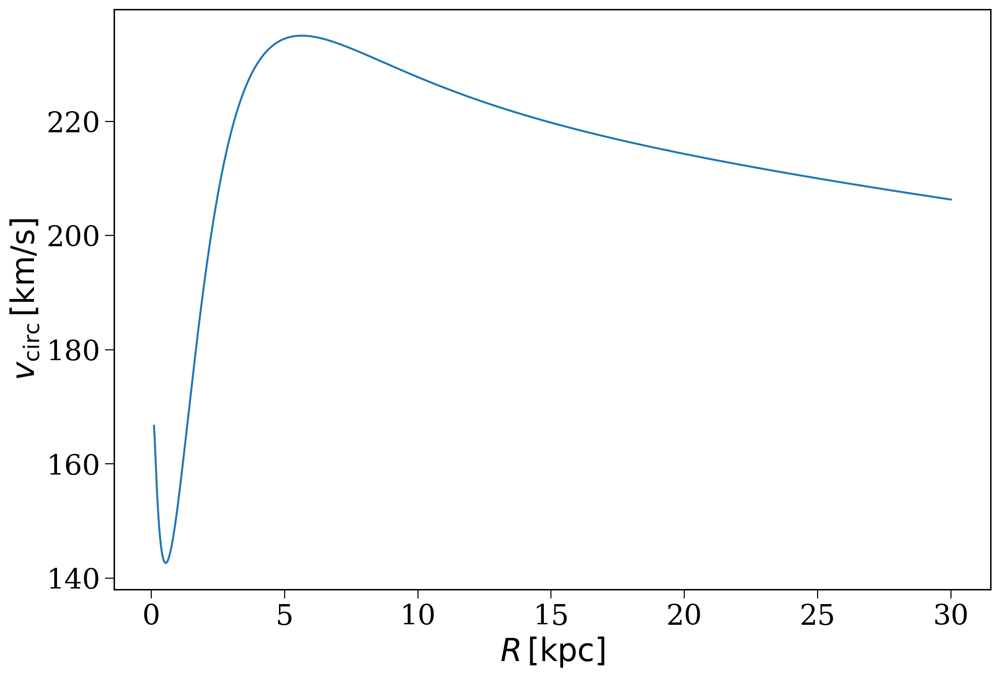

In [79]:
fig, ax = plt.subplots()

ax.plot(r_grid, get_v_circ(p.galactic_potential, r_grid))

ax.set(ylabel=r"$v_{\rm circ} \, [\rm km/s]$", xlabel=r"$R \, [\rm kpc]$")
    
plt.show()

In [59]:
just_obs_pop.final_bpp

,tphys,mass_1,mass_2,kstar_1,kstar_2,sep,porb,ecc,RRLO_1,RRLO_2,evol_type,aj_1,aj_2,tms_1,tms_2,massc_1,massc_2,rad_1,rad_2,mass0_1,mass0_2,lum_1,lum_2,teff_1,teff_2,radc_1,radc_2,menv_1,menv_2,renv_1,renv_2,omega_spin_1,omega_spin_2,B_1,B_2,bacc_1,bacc_2,tacc_1,tacc_2,epoch_1,epoch_2,bhspin_1,bhspin_2,bin_num,row_ind,metallicity
107373,4.911716,0.000000,32.901354,15.0,1.0,0.000000,0.000000,-1.000000,-1.000000e+00,0.00010,10.0,4.760230,0.410664,5.935741e+00,4.787313,0.000000,0.0,16.415730,9.853917,25.049111,32.901354,1.555929e+05,160620.332706,2.842084e+04,36975.606086,0.000000,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,5.708044e+02,23.520216,0.000000e+00,0.0,0.0,0.0,0.0,0.0,-0.105335,4.501052,0.0,0.0,107373,1339499,0.030000
129157,11.445662,1.277584,19.995332,13.0,1.0,-1.000000,-1.000000,-1.000000,1.000000e-04,0.00010,10.0,1.762289,3.912748,1.000000e+10,7.490751,1.277584,0.0,0.000014,9.492503,3.600423,19.995332,7.588509e-03,66256.152748,4.573458e+05,30191.576455,0.000014,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,5.106478e+08,2439.304597,1.468189e+12,0.0,0.0,0.0,0.0,0.0,9.683373,7.532914,0.0,0.0,129157,1610735,0.030000
178992,12.245887,1.277584,23.932429,13.0,1.0,-1.000000,-1.000000,-1.000000,1.000000e-04,0.00010,10.0,1.062775,4.260629,1.000000e+10,6.728250,1.277584,0.0,0.000014,11.270496,3.347875,23.932429,2.086547e-02,115239.677804,5.889286e+05,31819.884756,0.000014,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,3.779110e+08,1862.805968,2.160847e+12,0.0,0.0,0.0,0.0,0.0,11.183112,7.985257,0.0,0.0,178992,2233879,0.020266
222982,5.606406,1.986166,34.877686,13.0,1.0,-1.000000,-1.000000,-1.000000,1.000000e-04,0.00010,10.0,0.686830,2.103017,1.000000e+10,4.610070,1.986166,0.0,0.000014,13.239765,5.769447,34.877686,6.714315e-02,238330.323749,7.887802e+05,35206.617165,0.000014,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,8.803377e+07,1671.637692,1.384158e+13,0.0,0.0,0.0,0.0,0.0,4.919575,3.503389,0.0,0.0,222982,2782718,0.030000
343221,9.774816,1.392960,22.204477,13.0,1.0,-1.000000,-1.000000,-1.000000,1.000000e-04,0.00010,10.0,1.736189,3.715689,1.000000e+10,6.677693,1.392960,0.0,0.000014,10.550958,4.045241,22.204477,8.284666e-03,89781.887044,4.674922e+05,30897.323022,0.000014,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,2.095956e+08,2075.820343,3.611841e+12,0.0,0.0,0.0,0.0,0.0,8.038627,6.059127,0.0,0.0,343221,4281804,0.030000
360369,5.359104,0.000000,22.255986,15.0,1.0,0.000000,0.000000,-1.000000,-1.000000e+00,0.00010,10.0,3.906976,1.487476,7.456246e+00,6.661643,0.000000,0.0,9.533141,8.209563,20.075656,22.255986,6.706643e+04,68191.549893,3.021885e+04,32699.583619,0.000000,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,1.362096e+03,7.305076,0.000000e+00,0.0,0.0,0.0,0.0,0.0,-0.027951,3.871628,0.0,0.0,360369,4496287,0.030000
365126,10.460742,1.277584,21.781405,13.0,1.0,-1.000000,-1.000000,-1.000000,1.000000e-04,0.00010,10.0,0.440419,3.118908,1.000000e+10,6.813954,1.277584,0.0,0.000014,9.509291,3.492270,21.781405,1.215009e-01,77916.976126,9.148511e+05,31412.576965,0.000014,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,9.318265e+08,2669.440418,1.598293e+12,0.0,0.0,0.0,0.0,0.0,10.020323,7.341834,0.0,0.0,365126,4556230,0.030000
501406,8.263616,1.433329,28.818059,13.0,1.0,-1.000000,-1.000000,-1.000000,1.000000e-04,0.00010,10.0,0.590477,3.351318,1.000000e+10,5.270324,1.433329,0.0,0.000014,13.972808,4.171827,28.818059,7.300897e-02,181518.455629,8.054705e+05,32015.328996,0.000014,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,4.734557e+08,1398.784366,2.651785e+12,0.0,0.0,0.0,0.0,0.0,7.673139,4.912298,0.0,0.0,501406,6256422,0.030000
511038,9.917878,9.542872,20.197380,14.0,1.0,-1.000000,-1.000000,-1.000000,1.000000e-04,0.00010,10.0,0.419224,9.838912,1.000000e+10,9.854964,9.542872,0.0,0.000040,12.761628,22.584346,20.197380,1.000000e-10,117857.965527,2.882353e+03,30071.584249,0.000040,0.0,1.000000e-10,1.000000e-10,1.000000e-10,1.000000e-10,2.000000e+08,689.744156,0.0

In [43]:
observer_runaway_pop.final_vel

<Quantity [[-148.15245821,  514.33796485,  454.6800379 ],
           [  22.60332372,  356.08469543,  -34.20831419],
           [ -25.63625311,  314.0294102 ,   41.91615791],
           ...,
           [-139.25262888, -132.05573718,   -8.95109257],
           [-173.58729335,  207.04371633,   13.84220575],
           [   6.52435343, -122.05745432,  191.80249122]] km / s>

In [39]:
p.orbits

KeyboardInterrupt: 

In [33]:
just_obs

array([ 107373,  129157,  178992,  222982,  343221,  360369,  365126,
        501406,  511038,  515968,  543787,  571313,  718786,  889357,
       1005522, 1041815, 1065787, 1112932, 1223949, 1270914, 1409433,
       1513480, 1517195, 1616438, 1649866, 1655734, 1673592, 1713413,
       1733937, 1782245, 1959852, 2051898, 2077902, 2078479, 2081724,
       2327129, 2414814, 2420639, 2451098, 2502440, 2508953, 2608461,
       2656015, 2656136, 2658294, 2670920, 2710596, 2730703, 2792517,
       2929915, 2958940, 2996071, 3021850, 3041694, 3208012, 3294452])

## Ages

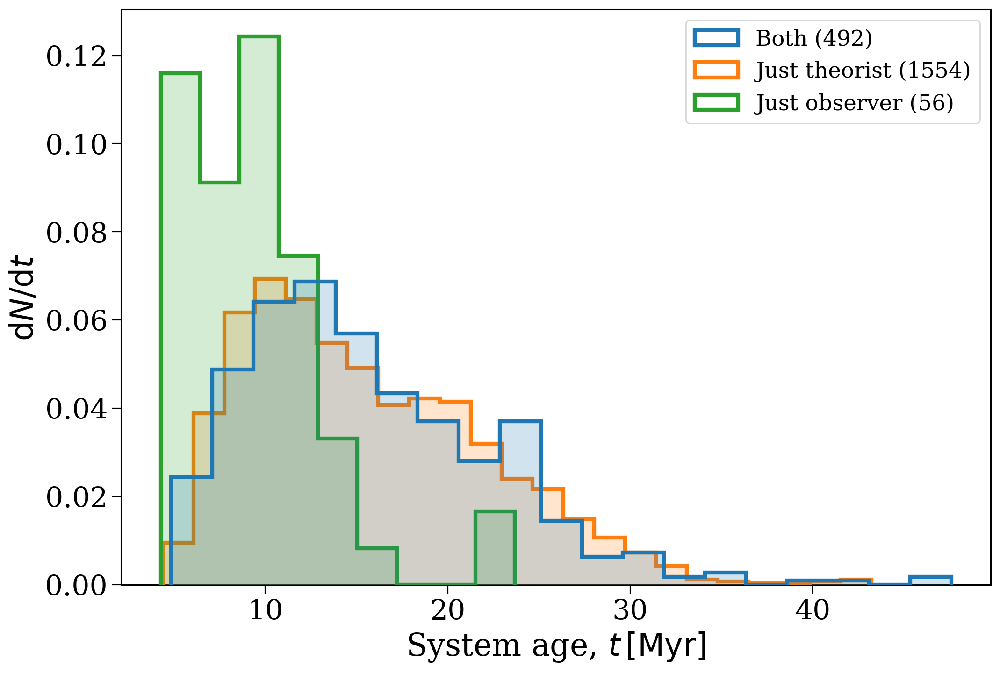

In [26]:
fig, ax = plt.subplots()

for nums, label, zorder, bins, c in zip([both_nums, just_theorist, just_obs], 
                                        [f"Both ({len(both_nums)})", f"Just theorist ({len(just_theorist)})", f"Just observer ({len(just_obs)})"],
                                        [10, 5, 5],
                                        ["fd", "fd", "fd"],
                                        ["C0", "C1", "C2"]):
    tphys = p.final_bpp.loc[nums]["tphys"].values
    ax.hist(tphys, zorder=zorder, bins=bins, alpha=0.2, density=True, color=c)
    ax.hist(tphys, histtype="step", zorder=zorder, bins=bins, density=True, color=c, lw=3, label=label)
    
ax.legend(fontsize=0.7*fs)

# ax.axvline(30, color="black", linestyle="dotted", zorder=100)

ax.set(xlabel=r"System age, $t \, [\rm Myr]$", ylabel=r"$\mathrm{d}N/\mathrm{d}t$")

plt.show()

# Runaway fractions
What fraction of O stars do runaway stars represent according to binary evolution?

In [16]:
bound = p.final_bpp["sep"] > 0.0

In [17]:
n_o_star_no_binary = ((~bound & observer_masks["o_star"][1] & observer_masks["nearby"][1]).sum()
                    + (~bound & observer_masks["o_star"][2] & observer_masks["nearby"][2]).sum()
                    + (bound & (observer_masks["o_star"][1] & observer_masks["o_star"][2] & observer_masks["nearby"][1])).sum()
                    + (bound & (observer_masks["o_star"][1] ^ observer_masks["o_star"][2] & observer_masks["nearby"][1])).sum())

In [18]:
n_o_star_total = observer_masks["o_star"][1].sum() + observer_masks["o_star"][2].sum()

In [19]:
for group, count in zip(["Theorist", "Observer"], [len(theorist_still_hot), len(observer_runaway_pop)]):
    print(f"According to the {group}")
    for total, text in zip([n_o_star_total, n_o_star_no_binary], ["counting all O stars", "counting O + O binaries as a single star"]):
        print(f"  The runaway fraction is {count / total * 100:1.1f}% when {text}")

According to the Theorist
  The runaway fraction is 1.9% when counting all O stars
  The runaway fraction is 2.5% when counting O + O binaries as a single star
According to the Observer
  The runaway fraction is 10.7% when counting all O stars
  The runaway fraction is 14.0% when counting O + O binaries as a single star


# Other nonsense

## COSMIC bug searching

In [128]:
hehg_at_mt_onset = p.bpp[(p.bpp["kstar_1"] == 8) & (p.bpp["evol_type"] == 3)]["bin_num"]
hehg_at_mt_end = p.bpp[(p.bpp["kstar_1"] == 8) & (p.bpp["evol_type"] == 4)]["bin_num"]
ce = p.bpp[p.bpp["evol_type"] == 7]["bin_num"]

In [146]:
started_mt_as_hehg = np.isin(p.bin_nums, hehg_at_mt_onset)
finished_mt_as_hehg = np.isin(p.bin_nums, hehg_at_mt_end)
experienced_ce = np.isin(p.bin_nums, ce)

In [147]:
started_mt_as_hehg.sum()

48760

In [151]:
(finished_mt_as_hehg & ~started_mt_as_hehg & experienced_ce).sum()

5072

## Mass dependent binary fractions

In [249]:
vh_bin_frac = lambda m: 0.5 + 0.25 * np.log10(m)

In [257]:
mass = np.array([0.03387365359804027, 0.0652863972800327, 0.10732527067435176, 0.2152449629076355, 0.4316820611399704, 0.8744049187657433, 1.045753040631026, 1.155061195267639, 1.9758529782002703, 3.9234492983780638, 6.386012259317638, 11.711229196523114, 29.229431744454512])
bin_frac = np.array([7.8125, 14.756944444444445, 18.40277777777778, 23.09027777777778, 29.86111111111111, 41.84027777777778, 46.701388888888886, 49.826388888888886, 67.70833333333333, 80.72916666666666, 88.71527777777777, 92.88194444444444, 95.83333333333333])

In [260]:
from scipy.interpolate import interp1d

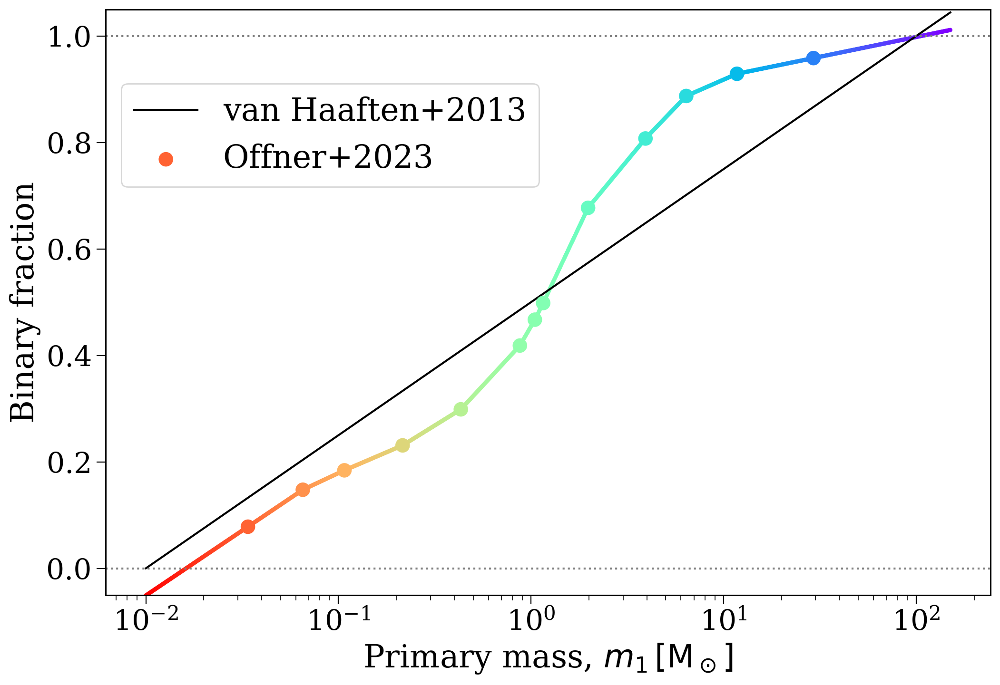

In [287]:
mass_range = np.geomspace(0.01, 150, 1000)
offner_func = interp1d(np.log10(mass), bin_frac / 100, bounds_error=False, fill_value="extrapolate")

fig, ax = plt.subplots()

ax.plot(mass_range, vh_bin_frac(mass_range), label="van Haaften+2013", color="black")
ax.scatter(mass, bin_frac / 100, c=np.log10(mass), cmap="rainbow_r", s=100, zorder=10, vmin=-2, vmax=np.log10(150), label="Offner+2023")
ax.scatter(mass_range, offner_func(np.log10(mass_range)), c=np.log10(mass_range), cmap="rainbow_r", s=5)

ax.set(xscale="log", xlabel=r"Primary mass, $m_1 \, [\rm M_\odot]$", ylabel="Binary fraction", ylim=(-0.05, 1.05))

ax.axhline(1.0, linestyle="dotted", color="grey")
ax.axhline(0.0, linestyle="dotted", color="grey")

ax.legend(loc="upper left", bbox_to_anchor=(0, 0.9))

plt.show()

In [9]:
ls /mnt/home/twagg/ceph/pops/feedback-variations/ -lh

total 497G
-rw-rw-r-- 1 twagg twagg  21G Mar 20  2025 Z-0.05.h5
-rw-rw-r-- 1 twagg twagg  21G Mar 20  2025 Z-0.1.h5
-rw-rw-r-- 1 twagg twagg  20G Mar 20  2025 Z-0.2.h5
-rw-rw-r-- 1 twagg twagg  19G Mar 20  2025 Z-0.5.h5
-rw-rw-r-- 1 twagg twagg  15G Mar 21  2025 beta-0.0.h5
-rw-rw-r-- 1 twagg twagg  17G Mar 21  2025 beta-0.5.h5
-rw-rw-r-- 1 twagg twagg  19G Mar 21  2025 beta-1.0.h5
-rw-rw-r-- 1 twagg twagg  16G Mar 21  2025 ccsn-20.h5
-rw-rw-r-- 1 twagg twagg  19G Mar 21  2025 ce-0.1.h5
-rw-rw-r-- 1 twagg twagg  18G Mar 21  2025 ce-10.0.h5
-rw-rw-r-- 1 twagg twagg  19G Mar 21  2025 ecsn-265.h5
-rw-rw-r-- 1 twagg twagg  18G Oct 22 14:12 fiducial.h5
-rw-rw-r-- 1 twagg twagg  29G Mar 21  2025 imf-1.9.h5
-rw-rw-r-- 1 twagg twagg 8.9G Mar 21  2025 imf-2.7.h5
drwxr-sr-x 3 twagg twagg  82G Dec  5  2024 kiel_method/
-rw-rw-r-- 1 twagg twagg  19G Mar 21  2025 no-fallback.h5
drwxrwsr-x 3 twagg twagg 188G Jul 23 14:29 no_orbits/
-rw-rw-r-- 1 twagg twagg  18G Mar 21  2025 porb-0.h5
-rw-rw-r-- 1 tw

# LSR stuff from Carrero-castrillo

In [7]:
p = cogsworth.pop.load("/mnt/home/twagg/ceph/pops/feedback-variations/fiducial.h5")

In [13]:
test_pop = cogsworth.pop.Population(10, galactic_potential=gp.MilkyWayPotential2022(),
                                    store_entire_orbits=True, use_default_BSE_settings=True)
test_pop.create_population()

/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(

Run for 10 binaries
Ended up with 10 binaries with m1 > 0 solar masses
[1e-02s] Sample initial binaries
[0.2s] Evolve binaries (run COSMIC)


  0%|          | 0/10 [00:00<?, ?it/s]

/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(
/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(
/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential20

100%|██████████| 10/10 [00:00<00:00, 697.92it/s]

/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(

/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(
/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2

In [15]:
SkyCoord(
    x=8.122 * u.kpc,
    y=0 * u.kpc,
    z=0 * u.kpc,
    v_x=0 * u.km / u.s,
    v_y=230 * u.km / u.s,
    v_z=0 * u.km / u.s,
    frame='galactocentric',
).transform_to("lsr").represent_as("cartesian").differentials["s"].d_xyz

<Quantity [-1.07406954,  3.16089354, -1.90534152] km / s>

In [19]:
from astropy.coordinates import SkyCoord
def get_v_tan_w_rsr_from_pop(p):
    # convert pop to astropy coords
    gal_cen = SkyCoord(
        x=p.final_pos[:, 0],
        y=p.final_pos[:, 1],
        z=p.final_pos[:, 2],
        v_x=p.final_vel[:, 0],
        v_y=p.final_vel[:, 1],
        v_z=p.final_vel[:, 2],
        frame='galactocentric',
    )
    # transform to LSR frame
    U_LSR, V_LSR, W_LSR = gal_cen.transform_to('lsr').represent_as("cartesian").differentials["s"].d_xyz

    # calculate circular velocity at final position from rotation curve
    v_circ = p.galactic_potential.circular_velocity(p.final_pos.T)
    theta = np.arctan2(p.final_pos[:, 1], p.final_pos[:, 0])

    # follow their assumptions for solar motion
    Theta_sun = 236 * u.km/u.s

    # convert to RSR frame
    U_RSR = U_LSR * np.cos(theta) - V_LSR * np.sin(theta) - Theta_sun * np.sin(theta)
    V_RSR = U_LSR * np.sin(theta) + V_LSR * np.cos(theta) - Theta_sun * np.cos(theta) - v_circ
    W_RSR = W_LSR

    # convert to tangential and line-of-sight velocities
    gal = gal_cen.transform_to('galactic')
    beta = ((gal.l + theta) - np.pi/2 * u.rad).to(u.rad)

    V_LOS = -V_RSR * np.sin(beta) - U_RSR * np.cos(beta)
    V_TAN = V_RSR * np.cos(beta) - U_RSR * np.sin(beta)
    print(np.linalg.norm(p.final_vel, axis=1))
    print(np.linalg.norm([V_TAN, W_RSR, V_LOS], axis=0))
    return V_TAN, W_RSR, V_LOS

get_v_tan_w_rsr_from_pop(test_pop)

[153.43971284 222.81250146 145.65665801 211.38636207 141.17853251
 255.02389598 221.97354359 310.93518342 114.23616833 196.62148672] km / s
[303.42129328 446.46304111 523.69144741 468.07279491 562.93636679
 530.63291425 635.21555022 334.71248881 448.11421304 254.78621398]


(<Quantity [ -83.37068868, -209.46385562,   31.72064443,  415.70767508,
            -150.70217871,  116.46431143,   42.55478684, -319.44094955,
            -349.42307079,  -36.46167283] km / s>,
 <Quantity [ -36.22901939, -342.26022806, -283.49178412, -146.44680658,
            -186.04057344, -129.37019747,  -90.77775803,  -40.05966446,
            -159.75200205,  -54.85346335] km / s>,
 <Quantity [-289.48448601,  195.73470964,  439.17985057, -157.58363828,
             509.48514348,  501.26909526,  627.25376364,   91.57048214,
             230.62775932,  246.12529087] km / s>)

In [137]:
p.final_vel[:, 2]

<Quantity [ -5.7026015 ,  -1.79528941,  -6.78330717,  -4.69381502,
            -7.72741262,  -3.16912956,  -6.88753446, -12.84911858,
            -5.82295504,  -8.12984641,  -8.12283527] km / s>

In [128]:
def get_v_tan_w_rsr(x, y, z, v_x, v_y, v_z, v_circ):
    # convert pop to astropy coords
    gal_cen = SkyCoord(
        x=x, y=y, z=z,
        v_x=v_x, v_y=v_y, v_z=v_z,
        frame='galactocentric',
    )
    # transform to LSR frame
    U_LSR, V_LSR, W_LSR = gal_cen.transform_to('lsr').represent_as("cartesian").differentials["s"].d_xyz

    # calculate circular velocity at final position from rotation curve
    theta = np.arctan2(gal_cen.y, gal_cen.x)

    # follow their assumptions for solar motion
    Theta_sun = 236 * u.km/u.s

    # convert to RSR frame
    U_RSR = U_LSR * np.cos(theta) - V_LSR * np.sin(theta) - Theta_sun * np.sin(theta)
    V_RSR = U_LSR * np.sin(theta) + V_LSR * np.cos(theta) - Theta_sun * np.cos(theta) - v_circ
    W_RSR = W_LSR

    # convert to tangential and line-of-sight velocities
    gal = gal_cen.transform_to('galactic')
    beta = ((gal.l + theta) - np.pi/2 * u.rad).to(u.rad)

    V_LOS = -V_RSR * np.sin(beta) - U_RSR * np.cos(beta)
    V_TAN = V_RSR * np.cos(beta) - U_RSR * np.sin(beta)
    return V_TAN, W_RSR

In [133]:
get_v_tan_w_rsr(x=8.122 * u.kpc, y=0 * u.kpc, z=0 * u.kpc,
                  v_x=0 * u.km / u.s, v_y=230 * u.km / u.s, v_z=0 * u.km / u.s,
                  v_circ=229.40403 * u.km / u.s)

(<Quantity -1.07450039 km / s>, <Quantity -1.90534152 km / s>)

In [130]:
get_v_tan_w_rsr_from_pop(p)

(<Quantity [257.40115238, 254.08447161, 258.67735402, 256.77519173,
            259.23601125, 255.18889129, 258.51602524, 263.53959594,
            257.86705757, 259.5867661 , 259.45025568] km / s>,
 <Quantity [-49.1073205 , -47.70269118, -45.48026185, -45.07549067,
            -48.38152334, -42.23363743, -43.02356237, -51.525537  ,
            -47.71679373, -49.7563372 , -48.18470061] km / s>)

In [ ]:
import astropy.units as u

# --- example input: a star already expressed in Galactocentric with velocities ---
# replace these with your actual data (must include v_x, v_y, v_z!)
gc = SkyCoord(
    x=  8.122 * u.kpc,   # +x points from GC toward the Sun
    y=  0.0 * u.kpc,   # +y toward Galactic rotation
    z=  0.017 * u.kpc,   # +z toward NGP
    v_x= 0.0 * u.km/u.s,  # velocities in the same axes
    v_y= 229.4 * u.km/u.s,
    v_z=   0.0 * u.km/u.s,
    frame="galactocentric"
)

# 1) transform to the Sun-centered Galactic frame
gal = gc.transform_to("galactic")

# 2) work in cartesian representation to read off heliocentric (U, V, W)
gal = gal.represent_as('cartesian', s='cartesian')

# by Astropy’s Galactic cartesian convention:
#   x toward l=0,b=0 (GC)   -> U (positive to GC)
#   y toward l=90,b=0       -> V (positive with rotation)
#   z toward b=+90 (NGP)    -> W (positive to NGP)
U_helio = gal.differentials['s'].d_x.to(u.km/u.s)
V_helio = gal.differentials['s'].d_y.to(u.km/u.s)
W_helio = gal.differentials['s'].d_z.to(u.km/u.s)

# 3) convert heliocentric velocities to the LSR by adding the Sun’s peculiar motion (U☉,V☉,W☉)
U_sun_pec, V_sun_pec, W_sun_pec = (10.6, 10.7, 7.6) * u.km/u.s

U_lsr = U_helio + U_sun_pec
V_lsr = V_helio + V_sun_pec
W_lsr = W_helio + W_sun_pec

print(f"U_LSR = {U_lsr:.2f}, V_LSR = {V_lsr:.2f}, W_LSR = {W_lsr:.2f}")

U_LSR = -2.28 km / s, V_LSR = -5.50 km / s, W_LSR = -0.21 km / s


# Clustered near sun from Sanders & Binney

In [45]:
s = cogsworth.sfh.SandersBinney2015(10000, immediately_sample=True, potential=gp.MilkyWayPotential2022(), verbose=True)

/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(

Pre-computing lookback time, guiding radius and frequency interpolations
Initiating sampling procedure
  Sampling 8132 stars from the thin_disc
    Sampling 974 stars with lookback times between 0.00 Gyr and 2.00 Gyr
    Sampling 1310 stars with lookback times between 2.00 Gyr and 4.00 Gyr
    Sampling 1526 stars with lookback times between 4.00 Gyr and 6.00 Gyr
    Sampling 1965 stars with lookback times between 6.00 Gyr and 8.00 Gyr
    Sampling 2357 stars with lookback times between 8.00 Gyr and 10.00 Gyr
  Sampling 1868 stars from the thick_disc
    

In [3]:
class RecentSB15Annulus(cogsworth.sfh.SandersBinney2015):
    def __init__(self, age_cutoff=200 * u.Myr, **kwargs):
        self.age_cutoff = age_cutoff
        super().__init__(**kwargs)

    def draw_lookback_times(self):
        tau_range = np.linspace(0, self.tau_m * (1 - 1e-10), 100000)
        tau_pdf = np.exp(tau_range / self.tau_F - self.tau_S / (self.tau_m - tau_range))
        tau_cdf = cumulative_trapezoid(tau_pdf, tau_range, initial=0)
        
        lim = (tau_cdf / tau_cdf[-1])[tau_range >= self.age_cutoff][0]
        U = np.random.uniform(0, lim, self._size)
        self._tau = self._inv_cdf(U) * u.Gyr
        return self._tau
    
    def _generate_df(self, J, component, tau):
        df_val = super()._generate_df(J=J, component=component, tau=tau)
        J_r, J_z, J_phi = J.T
        df_val[(J_phi < 1.17) | (J_phi > 2.8)] = 0.0
        return df_val

In [ ]:
list(s.__dict__.keys())

['_size',
 'time_bins',
 'tau_m',
 'tau_S',
 'tau_T',
 'tau_F',
 'tau_1',
 'verbose',
 '_inv_cdf',
 '_guiding_radius_interp',
 '_omega_interp',
 '_kappa_interp',
 '_nu_interp',
 'potential',
 '_agama_pot',
 '_components',
 '_component_masses',
 '_tau',
 '_Z',
 '_x',
 '_y',
 '_z',
 '_which_comp',
 '__citations__',
 'galaxy_age',
 'v_x',
 'v_y',
 'v_z',
 'v_R',
 'v_T']

In [4]:
class ClusteredNearSun(cogsworth.sfh.StarFormationHistory):
    def __init__(self, size, sfh_model, sfh_params,
                 near_thresh=3 * u.kpc,
                 cluster_radius=1 * u.pc,
                 n_per_cluster=10000,
                 velocity_dispersion=2 * u.km / u.s,
                 immediately_sample=True):
        self._size = size
        self.near_thresh = near_thresh
        self.cluster_radius = cluster_radius
        self.n_per_cluster = n_per_cluster
        self.velocity_dispersion = velocity_dispersion
        self.sfh_model = sfh_model
        self.sfh_params = sfh_params
        self.__citations__ = []

        if immediately_sample:
            self.sample()

    def sun_pos(self, t):
        sun_R = 8.122 * u.kpc
        sun_v = 229.40403 * u.km / u.s
        T = ((2 * np.pi * sun_R) / sun_v).to(u.Myr)
        theta = ((2 * np.pi * t / T) % (2 * np.pi)).decompose() * u.rad
        x = sun_R * np.cos(theta)
        y = sun_R * np.sin(theta)
        return x, y
    
    def sample(self):
        n_clusters = int(np.ceil(self.size / self.n_per_cluster))

        sampled_sfhs = []
        while sum(len(s) for s in sampled_sfhs) < n_clusters:
            sfh = self.sfh_model(size=n_clusters * 10, **self.sfh_params)
            sun_x, sun_y = self.sun_pos(-sfh.tau)
            dist_to_sun = np.sqrt((sfh.x - sun_x)**2 + (sfh.y - sun_y)**2)
            masked_sfh = sfh[dist_to_sun <= self.near_thresh]
            print(f"  Selected {len(masked_sfh)} stars within {self.near_thresh} of the Sun")
            sampled_sfhs.append(masked_sfh)
        self._sampled_sfh = cogsworth.sfh.concat(*sampled_sfhs)[:n_clusters]

        data_attributes = ["_tau", "_Z", "_x", "_y", "_z", "_which_comp", "v_R", "v_T", "v_z", "v_x", "v_y"]
        for attr in data_attributes:
            if hasattr(self._sampled_sfh, attr):
                data = np.repeat(getattr(self._sampled_sfh, attr), self.n_per_cluster)[:self.size]
                setattr(self, attr, data)

        # apply cluster spread to positions
        self._x, self._y, self._z = np.random.normal(
            [self._x.to(u.kpc).value,
             self._y.to(u.kpc).value,
             self._z.to(u.kpc).value],
             self.cluster_radius.to(u.kpc).value / np.sqrt(3),
             size=(3, self._size)
        ) * u.kpc

        # if the sfh has velocities, apply velocity dispersion
        if hasattr(self._sampled_sfh, "v_R"):
            self.v_R, self.v_T, self.v_z = np.random.normal(
                [self.v_R.to(u.km/u.s).value,
                 self.v_T.to(u.km/u.s).value,
                 self.v_z.to(u.km/u.s).value],
                 self.velocity_dispersion.to(u.km/u.s).value / np.sqrt(3),
                 size=(3, self._size)
            ) * u.km / u.s

            if hasattr(self._sampled_sfh, "v_x"):
                v_phi = (self.v_T / self.rho)
                self.v_x = (self.v_R * np.cos(self.phi) - self.rho * np.sin(self.phi) * v_phi)
                self.v_y = (self.v_R * np.sin(self.phi) + self.rho * np.cos(self.phi) * v_phi)
        else:
            # warn the user that no velocities were applied
            logging.getLogger("cogsworth").warning("The provided SFH model does not have velocities; no velocity dispersion applied.")

In [5]:
test = ClusteredNearSun(10_000_000, sfh_model=RecentSB15Annulus,
                        sfh_params={
                            "age_cutoff": 200 * u.Myr,
                            "verbose": True,
                            "potential": gp.MilkyWayPotential2022(),
                            "immediately_sample": True
                        },
                        near_thresh=3 * u.kpc,
                        cluster_radius=1 * u.pc,
                        n_per_cluster=5000)

/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(


Pre-computing lookback time, guiding radius and frequency interpolations
Initiating sampling procedure
  Sampling 20000 stars from the thin_disc
    Sampling 20000 stars with lookback times between 0.00 Gyr and 2.00 Gyr
  Selected 1692 stars within 3.0 kpc of the Sun
Pre-computing lookback time, guiding radius and frequency interpolations
Initiating sampling procedure
  Sampling 20000 stars from the thin_disc
    Sampling 20000 stars with lookback times between 0.00 Gyr and 2.00 Gyr
  Selected 1757 stars within 3.0 kpc of the Sun


In [6]:
test.save("test")

TypeError: cannot pickle 'agama.Potential' object

In [44]:
s

NameError: name 's' is not defined

In [43]:
p = cogsworth.pop.Population(1000, galactic_potential=gp.MilkyWayPotential2022(), sfh_model=ClusteredNearSun,
                             sfh_params={"sfh_model": RecentSB15Annulus,
                                         "sfh_params": {"age_cutoff": 200 * u.Myr,
                                                        "verbose": True,
                                                        "potential": gp.MilkyWayPotential2022(),
                                                        "immediately_sample": True},
                                         "near_thresh": 3 * u.kpc,
                                         "cluster_radius": 1 * u.pc,
                                         "n_per_cluster": 5},
                             store_entire_orbits=False, use_default_BSE_settings=True)
p.create_population()

/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(

Run for 1000 binaries
Pre-computing lookback time, guiding radius and frequency interpolations
Initiating sampling procedure
  Sampling 2020 stars from the thin_disc
    Sampling 2020 stars with lookback times between 0.00 Gyr and 2.00 Gyr
  Selected 158 stars within 3.0 kpc of the Sun
Pre-computing lookback time, guiding radius and frequency interpolations
Initiating sampling procedure
  Sampling 2020 stars from the thin_disc
    Sampling 2020 stars with lookback times between 0.00 Gyr and 2.00 Gyr
  Selected 174 stars within 3.0 kpc of the Sun
Ended up

  0%|          | 0/1006 [00:00<?, ?it/s]

/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(
/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(
/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential20

 35%|███▍      | 352/1006 [00:00<00:00, 2708.85it/s]

/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(



1008it [00:00, 1151.37it/s]                         


/mnt/home/twagg/codes/cogsworth/cogsworth/pop.py:1161: UserWarning: 5 bad orbit(s) detected, removing them from the population (initial conditions for these systems were saved to `bad_orbits.h5` file)
  warnings.warn(f"{bad_orbits.sum()} bad orbit(s) detected, removing them from the population" +



TypeError: cannot pickle 'agama.Potential' object

In [40]:
test.v_x

<Quantity [-91.85161454, -90.98943872, -91.80151152, ...,  29.28565306,
            29.20518483,  27.14752344] km / s>

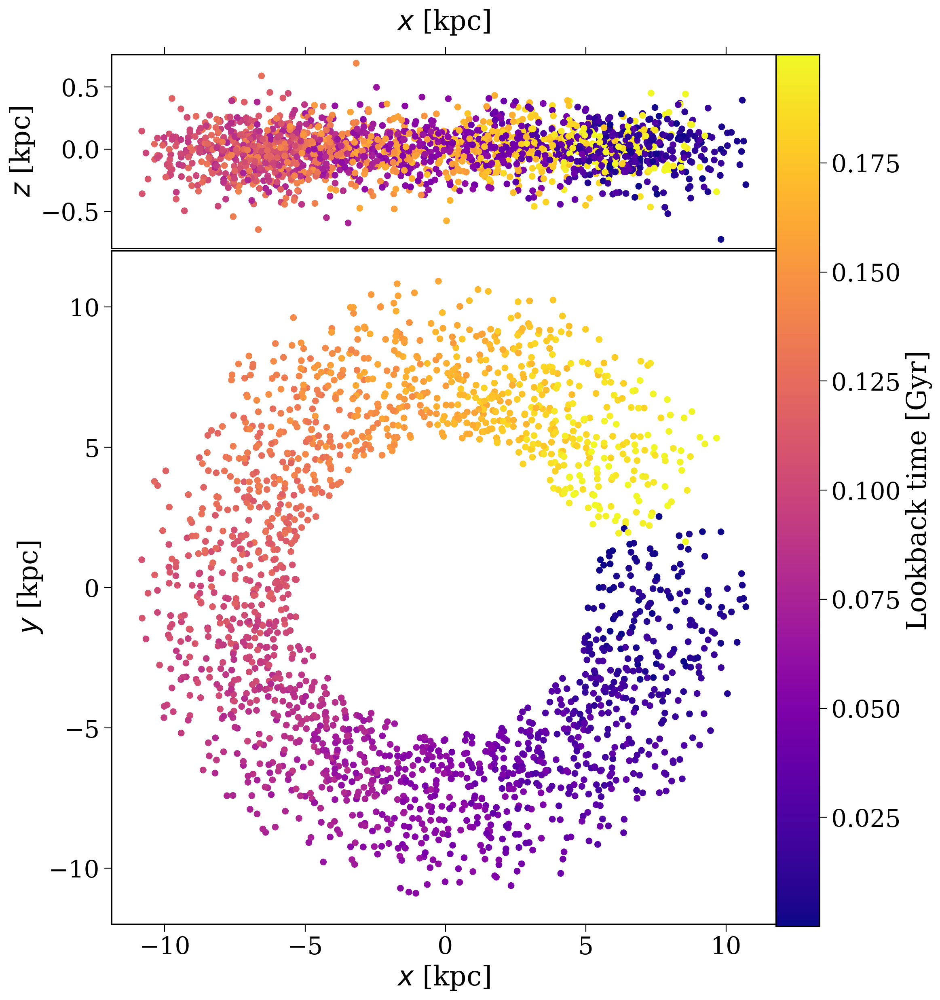

In [12]:
test._sampled_sfh.plot(colour_by=test._sampled_sfh._tau.value, cbar_norm=None, s=25, cbar_label="Lookback time [Gyr]");

In [194]:
s2 = ClusteredRecentSB15(size=10000, immediately_sample=True, potential=gp.MilkyWayPotential2022(), verbose=True)

/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(

Setting up Sanders & Binney 2015 star formation history model to work with Agama
Pre-computing lookback time, guiding radius and frequency interpolations
Initiating sampling procedure
  Sampling 10000 stars from the thin_disc
    Sampling 10000 stars with lookback times between 0.00 Gyr and 2.00 Gyr


In [211]:
s3 = ClusteredRecentSB15(size=100000, immediately_sample=True, potential=gp.MilkyWayPotential2022(), verbose=True)

/mnt/home/twagg/codes/gala/src/gala/potential/potential/builtin/special.py:257: GalaFutureWarning: The MilkyWayPotential2022 class will be deprecated soon. Instead, use: MilkyWayPotential(version="v2") to get what is currently the MilkyWayPotential2022 class. Or, to always use the latest Milky Way model in Gala, you can call the class with no arguments MilkyWayPotential() or specify MilkyWayPotential(version="latest")
  warnings.warn(

Setting up Sanders & Binney 2015 star formation history model to work with Agama
Pre-computing lookback time, guiding radius and frequency interpolations
Initiating sampling procedure
  Sampling 100000 stars from the thin_disc
    Sampling 100000 stars with lookback times between 0.00 Gyr and 2.00 Gyr


In [213]:
s = s2 + s3

Ignoring extra parameters: dict_keys(['tau_m', 'tau_S', 'tau_T', 'tau_F', 'tau_1', 'galaxy_age', 'v_x', 'v_y'])


Setting up Sanders & Binney 2015 star formation history model to work with Agama
Pre-computing lookback time, guiding radius and frequency interpolations


Ignoring extra parameters: dict_keys(['tau_m', 'tau_S', 'tau_T', 'tau_F', 'tau_1', 'galaxy_age', 'v_x', 'v_y'])


Setting up Sanders & Binney 2015 star formation history model to work with Agama
Pre-computing lookback time, guiding radius and frequency interpolations


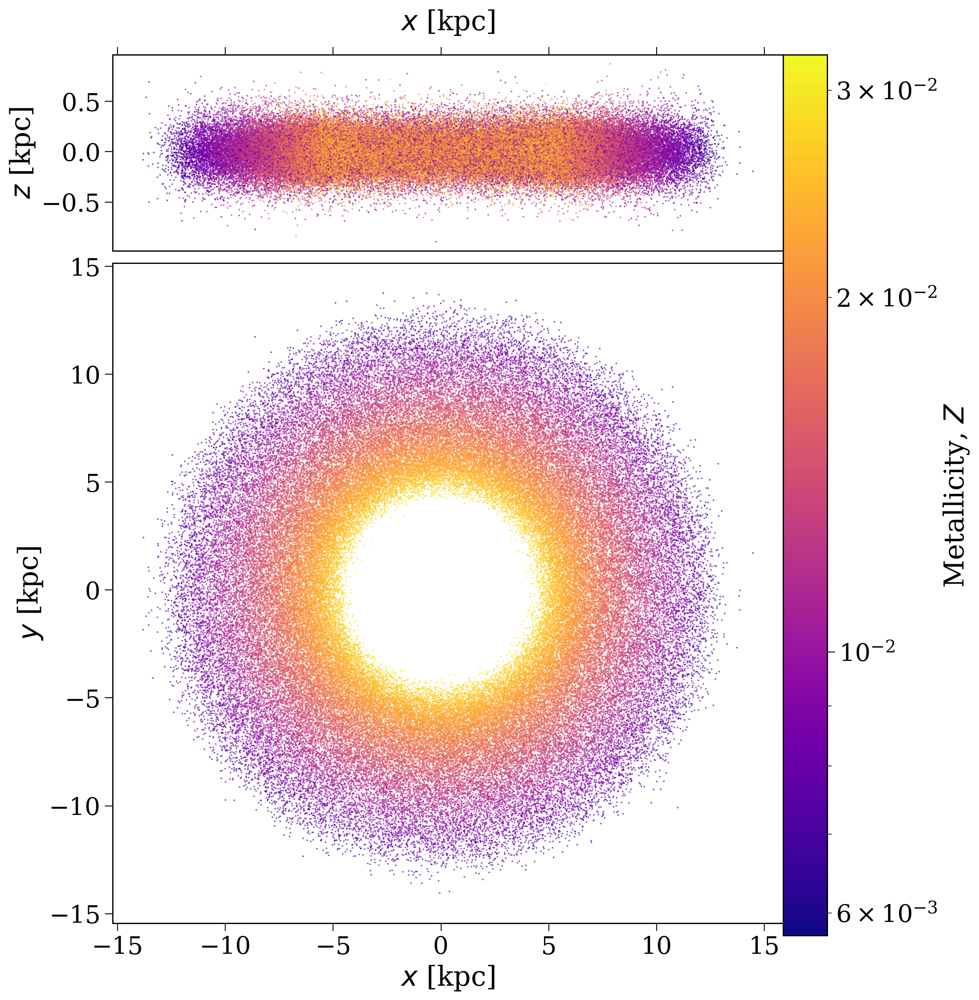

(<Figure size 1247.5x1400 with 3 Axes>,
 array([<Axes: xlabel='$x$ [kpc]', ylabel='$z$ [kpc]'>,
        <Axes: xlabel='$x$ [kpc]', ylabel='$y$ [kpc]'>], dtype=object))

In [212]:
(s2 + s3).plot()

In [214]:
sun_x, sun_y = s.sun_pos(-s._tau)
dist = ((sun_x - s.x)**2 + (sun_y - s.y)**2)**(0.5)

In [ ]:
p.initial_galaxy

In [207]:
3e6 / 1e3

3000.0

In [215]:
(dist < s.near_thresh).sum()

np.int64(9189)

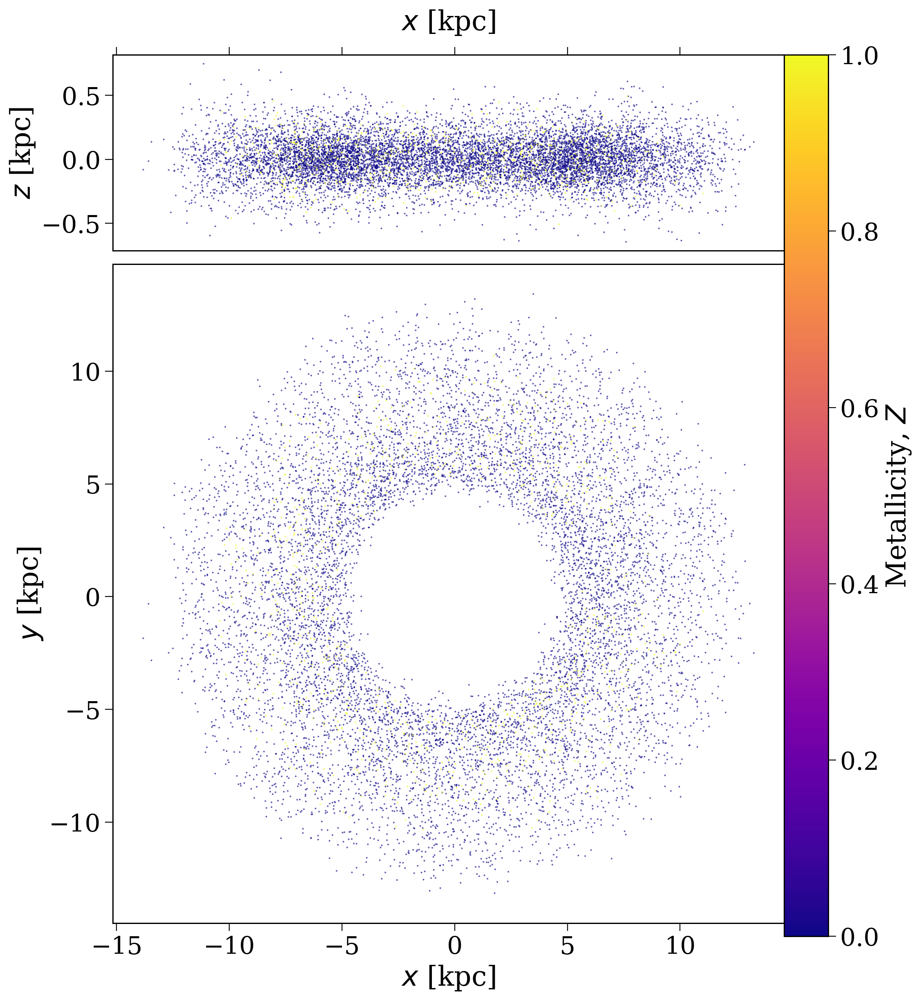

(<Figure size 1247.5x1400 with 3 Axes>,
 array([<Axes: xlabel='$x$ [kpc]', ylabel='$z$ [kpc]'>,
        <Axes: xlabel='$x$ [kpc]', ylabel='$y$ [kpc]'>], dtype=object))

In [ ]:
s2.plot(colour_by=dist.value < 3, cbar_norm=None)

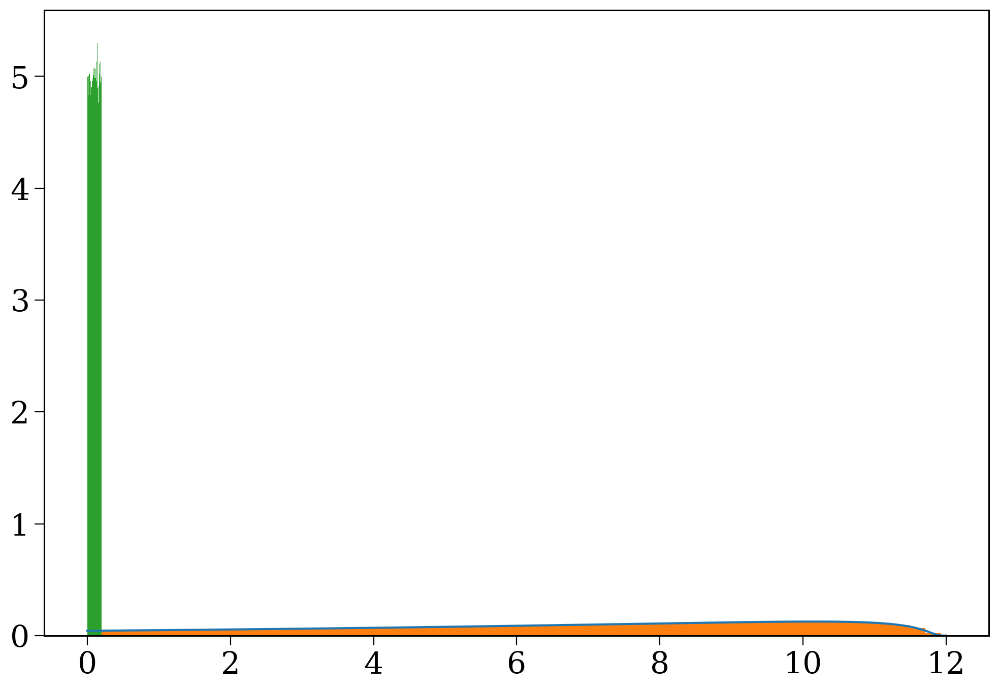

In [152]:
tau_range = np.linspace(0, 12 - 1e-10, 10000)
pdf = np.exp(tau_range / 8 - .43 / (12 - tau_range))

# normalise pdf
pdf /= np.trapezoid(pdf, tau_range)

plt.plot(tau_range, pdf)
# tau_range = np.linspace(0, .2, 10000)
# pdf = np.exp(tau_range / 8 - .43 / (12 - tau_range))
# plt.plot(tau_range, pdf)
# plt.ylim(0, 3)

plt.hist(s.draw_lookback_times().to(u.Gyr), bins="fd", density=True)
plt.hist(s2.draw_lookback_times().to(u.Gyr), bins="fd", density=True)

plt.show()